<span style="font-family:Papyrus; font-size:2.5em;">Generative Adversarial Networks (GANs)</span>
---
![](https://espresso-jobs.com/conseils-carriere/wp-content/uploads/2019/05/monalisa.gif)
<br>

# Introduction

- Generative Adversarial Networks (GANs)
- How GANs Work
- GANs Process
- Examples

### Generative Adversarial Networks (GANs)

Generative Adversarial Networks are used to generate images that never existed before. They learn about the world (objects, animals and so forth) and create new versions of those images that never existed.

They have two components:

- A **Generator** - this creates the images.
- A **Discriminator** - this assesses the images and tells the generator if they are similar to what it has been trained on. These are based off real world examples.

When training the network, both the generator and discriminator start from scratch and learn together.

### How GANs Work


**G** for **Generative** - this is a model that takes an input as a random noise singal and then outputs an image.

![](https://camo.githubusercontent.com/a2c5a0db812c0ade199e5ccacf86c6cff4db1685/68747470733a2f2f61636975732e636f2e756b2f77702d636f6e74656e742f7468656d65732f61636975732f6d616368696e655f6c6561726e696e672f696d67732f63762f67656e657261746976652e706e67)

**A** for **Adversarial** - this is the discriminator, the opponent of the generator. This is capable of learning about objects, animals or other features specified. For example: if you supply it with pictures of dogs and non-dogs, it would be able to identify the difference between the two.

![](https://camo.githubusercontent.com/96c8ccb9a91b8789106c1b3dfc9d62dde9d3cbe1/68747470733a2f2f61636975732e636f2e756b2f77702d636f6e74656e742f7468656d65732f61636975732f6d616368696e655f6c6561726e696e672f696d67732f63762f6469736372696d696e61746f722d6578616d706c652e706e67)

Using this example, once the discriminator has been trained, showing the discriminator a picture that isn't a dog it will return a 0. Whereas, if you show it a dog it will return a 1.

![](https://camo.githubusercontent.com/8b5978b05b5ab4cd9bfba4819a0f0e09a12c8068/68747470733a2f2f61636975732e636f2e756b2f77702d636f6e74656e742f7468656d65732f61636975732f6d616368696e655f6c6561726e696e672f696d67732f63762f6469736372696d696e61746f722d73636f7265732e706e67)

**N** for **Network** - meaning the generator and discriminator are both neural networks.


### GANs Process

**Step 1** - we input a random noise signal into the generator. The generator creates some images which is used for training the discriminator. We provide the discriminator with some features/images we want it to learn and the discriminator outputs probabilities. These probabilities can be rather high as the discriminator has only just started being trained. The values are then assessed and identified. The error is calculated and these are backpropagated through the discriminator, where the weights are updated.

![](https://camo.githubusercontent.com/a26a06e2437514df1bbd736480f06a86aabebef8/68747470733a2f2f61636975732e636f2e756b2f77702d636f6e74656e742f7468656d65732f61636975732f6d616368696e655f6c6561726e696e672f696d67732f63762f73746570312d6469736372696d696e61746f722e706e67)

Next we train the generator. We take the batch of images that it created and put them through the discriminator again. We do not include the feature images. The generator learns by tricking the discriminator into it outputting false positives.

The discriminator will provide an output of probabilities. The values are then assessed and compared to what they should have been. The error is calculated and backpropagated through the generator and the weights are updated.

![](https://camo.githubusercontent.com/07a68fab0dbea632b29d6186e298a6c05333497c/68747470733a2f2f61636975732e636f2e756b2f77702d636f6e74656e742f7468656d65732f61636975732f6d616368696e655f6c6561726e696e672f696d67732f63762f73746570312d67656e657261746f722e706e67)

**Step 2** - This is the same as step 1 but the generator and discriminator are trained a little more. Through backpropagation the generator understands its mistakes and starts to make them more like the feature.

This is created through a *Deconvolutional Neural Network*.

### Examples

**GANs** can be used for the following:

- Generating Images
- Image Modification
- Super Resolution
- Assisting Artists
- Photo-Realistic Images
- Speech Generation
- Face Ageing

<br>
**[It’s Training Cats and Dogs: NVIDIA Research Uses AI to Turn Cats Into Dogs, Lions and Tigers, Too](https://blogs.nvidia.com/blog/2018/04/15/nvidia-research-image-translation/)**
<img src="https://blogs.nvidia.com/wp-content/uploads/2018/04/cats-dogs-nvresearch1.png" height="700" width="500">
<br>
<img src="https://cdn-images-1.medium.com/max/800/1*HaExieykcOT5oI2_xKisrQ.png" height="700" width="500">


In [1]:
import os
print(os.listdir("../input"))

['all-dogs', 'all-dogs.zip', 'Annotation.zip']


**Importing the libraries**

In [2]:
from __future__ import print_function
import time
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm_notebook as tqdm

## Some dogs

> The Stanford Dogs dataset contains images of 120 breeds of dogs from around the world.

There are 23906 pictures of dogs.


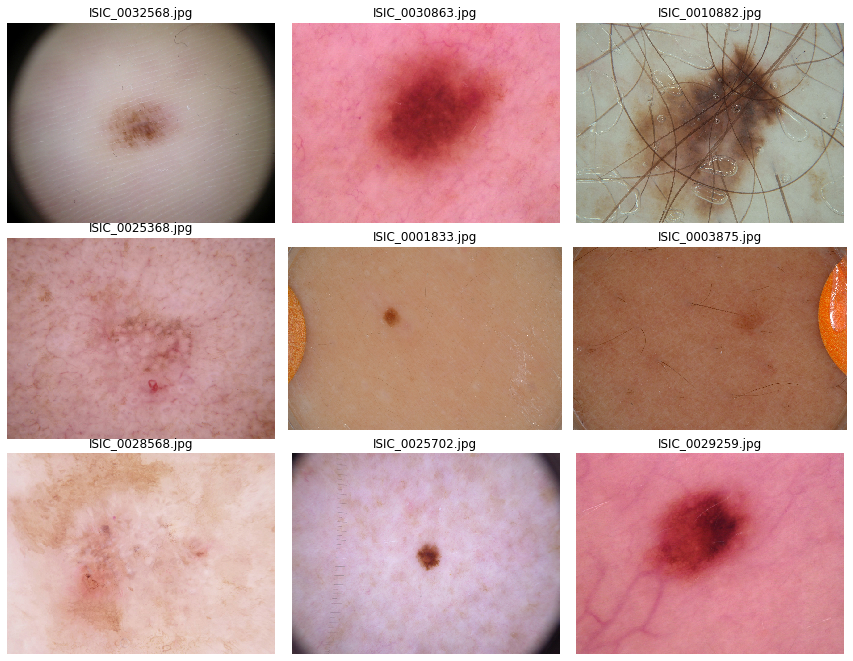

In [3]:
PATH = '../input/all-dogs/all-dogs/'
images = os.listdir(PATH)
print(f'There are {len(os.listdir(PATH))} pictures of dogs.')

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(os.listdir(PATH)))
    # https://matplotlib.org/users/image_tutorial.html
    img = plt.imread(PATH + images[rnd_indx])
    imgplot = axis.imshow(img)
    axis.set_title(images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Insights

Check this posts:

>[Quick data explanation and EDA](https://www.kaggle.com/witold1/quick-data-explanation-and-eda) by @witold1

> [New Insights](https://www.kaggle.com/c/generative-dog-images/discussion/97863#latest-564673)

- There are pictures with more than one dog (even with  3  dogs);
- There are pictures with the dog (-s) and person (people);
- There are pictures with more than one person (even with  4  people);
- There are pictures where dogs occupy less than  1/5  of the picture;
- There are pictures with text (magazine covers, from dog shows, memes and pictures with text);
- Even wild predators included, e.g. African wild dog or Dingo, but not wolves.

**Examples**

<img src="https://i.ibb.co/cxZ3nwd/Captura-de-pantalla-de-2019-06-29-12-31-41.png" alt="Captura-de-pantalla-de-2019-06-29-12-31-41">
<img src="https://i.ibb.co/TRzg1JG/Captura-de-pantalla-de-2019-06-29-12-32-48.png" alt="Captura-de-pantalla-de-2019-06-29-12-32-48">
<img src="https://i.ibb.co/LNgrSTj/Captura-de-pantalla-de-2019-06-29-12-32-28.png" alt="Captura-de-pantalla-de-2019-06-29-12-32-28">
<img src="https://i.ibb.co/p1LBrz3/Captura-de-pantalla-de-2019-06-29-12-31-59.png" alt="Captura-de-pantalla-de-2019-06-29-12-31-59">



# Image Preprocessing
### Check: [GAN dogs starter](https://www.kaggle.com/wendykan/gan-dogs-starter)

**Initial code ...**

```
batch_size = 32
batchSize = 64
imageSize = 64

# 64x64 images!
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('../input/all-dogs/', transform=transform)

dataloader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)

imgs, label = next(iter(dataloader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

```

**New data Data loader and Augmentations from [RaLSGAN dogs](https://www.kaggle.com/speedwagon/ralsgan-dogs)**

In [4]:
batch_size = 32
image_size = 64

random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomApply(random_transforms, p=0.2),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('../input/all-dogs/', transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)
                                           
imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


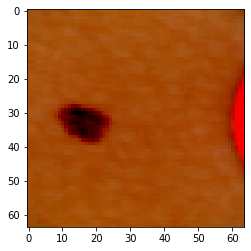

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


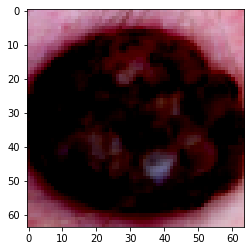

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


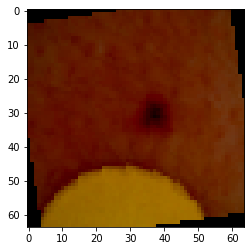

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


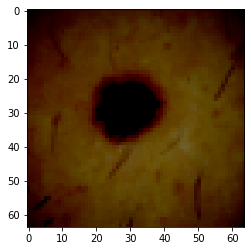

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


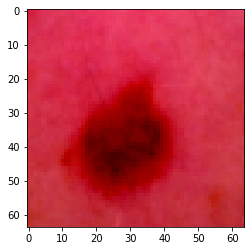

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


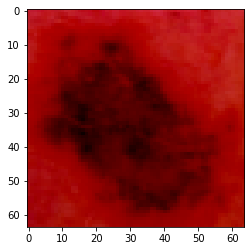

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


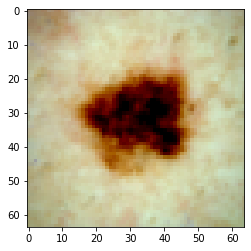

In [5]:
for i in range(3,10):
    plt.imshow(imgs[i])
    #np.array(img,np.int32)
    #plt.imshow(np.array(img[i],np.int32))
    ##plt.imshow((imgs[i]*255).astype(np.uint8))
    plt.show()

# Weights
### Defining the weights_init function

In [6]:
def weights_init(m):
    """
    Takes as input a neural network m that will initialize all its weights.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

# Generator

In [7]:
class G(nn.Module):
    def __init__(self):
        # Used to inherit the torch.nn Module
        super(G, self).__init__()
        # Meta Module - consists of different layers of Modules
        self.main = nn.Sequential(
                nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0, bias=False),
                nn.BatchNorm2d(512),
                nn.ReLU(True),
                nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU(True),
                nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.ReLU(True),
                nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.ReLU(True),
                nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
                nn.Tanh()
                )
        
    def forward(self, input):
        output = self.main(input)
        return output

# Creating the generator
netG = G()
netG.apply(weights_init)

G(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

# Discriminator

In [8]:
# Defining the discriminator
class D(nn.Module):
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(256, 512, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(512, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )
        
    def forward(self, input):
        output = self.main(input)
        # .view(-1) = Flattens the output into 1D instead of 2D
        return output.view(-1)
    
    
# Creating the discriminator
netD = D()
netD.apply(weights_init)


D(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

## Another setup

In [9]:
class Generator(nn.Module):
    def __init__(self, nz=128, channels=3):
        super(Generator, self).__init__()
        
        self.nz = nz
        self.channels = channels
        
        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0):
            block = [
                nn.ConvTranspose2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False),
                nn.BatchNorm2d(n_output),
                nn.ReLU(inplace=True),
            ]
            return block

        self.model = nn.Sequential(
            *convlayer(self.nz, 1024, 4, 1, 0), # Fully connected layer via convolution.
            *convlayer(1024, 512, 4, 2, 1),
            *convlayer(512, 256, 4, 2, 1),
            *convlayer(256, 128, 4, 2, 1),
            *convlayer(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, self.channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(-1, self.nz, 1, 1)
        img = self.model(z)
        return img

    
class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()
        
        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0, bn=False):
            block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
            if bn:
                block.append(nn.BatchNorm2d(n_output))
            block.append(nn.LeakyReLU(0.2, inplace=True))
            return block

        self.model = nn.Sequential(
            *convlayer(self.channels, 32, 4, 2, 1),
            *convlayer(32, 64, 4, 2, 1),
            *convlayer(64, 128, 4, 2, 1, bn=True),
            *convlayer(128, 256, 4, 2, 1, bn=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),  # FC with Conv.
        )

    def forward(self, imgs):
        logits = self.model(imgs)
        out = torch.sigmoid(logits)
    
        return out.view(-1, 1)

# Training

**My training baseline**

In [10]:
!mkdir results
!ls

하위 디렉터리 또는 파일 results이(가) 이미 있습니다.


GAN Introduction.ipynb
Include
LICENSE.txt
Lib
Scripts
etc
requirements.txt
results
share
tcl


In [11]:
EPOCH = 0 # play with me
LR = 0.001
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=LR, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR, betas=(0.5, 0.999))

This doesn't run because EPOCH = 0, change it and try ;)

In [12]:
for epoch in range(EPOCH):
    for i, data in enumerate(dataloader, 0):
        # 1st Step: Updating the weights of the neural network of the discriminator
        netD.zero_grad()
        
        # Training the discriminator with a real image of the dataset
        real,_ = data
        input = Variable(real)
        target = Variable(torch.ones(input.size()[0]))
        output = netD(input)
        errD_real = criterion(output, target)
        
        # Training the discriminator with a fake image generated by the generator
        noise = Variable(torch.randn(input.size()[0], 100, 1, 1))
        fake = netG(noise)
        target = Variable(torch.zeros(input.size()[0]))
        output = netD(fake.detach())
        errD_fake = criterion(output, target)
        
        # Backpropagating the total error
        errD = errD_real + errD_fake
        errD.backward()
        optimizerD.step()
        
        # 2nd Step: Updating the weights of the neural network of the generator
        netG.zero_grad()
        target = Variable(torch.ones(input.size()[0]))
        output = netD(fake)
        errG = criterion(output, target)
        errG.backward()
        optimizerG.step()
        
        # 3rd Step: Printing the losses and saving the real images and the generated images of the minibatch every 100 steps
        print('[%d/%d][%d/%d] Loss_D: %.4f; Loss_G: %.4f' % (epoch, EPOCH, i, len(dataloader), errD.item(), errG.item()))
        if i % 100 == 0:
            vutils.save_image(real, '%s/real_samples.png' % "./results", normalize=True)
            fake = netG(noise)
            vutils.save_image(fake.data, '%s/fake_samples_epoch_%03d.png' % ("./results", epoch), normalize=True)

# Best public training
- 06/29 [RaLSGAN dogs](https://www.kaggle.com/speedwagon/ralsgan-dogs) V9
- 06/29 this kernel V5
- some version of this kernel

### Parameters

In [13]:
batch_size = 32
LR_G = 0.001
LR_D = 0.0005

beta1 = 0.5
epochs = 100

real_label = 0.9
fake_label = 0
nz = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Initialize models and optimizers

In [14]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

**Plot Loss per EPOCH**
> plot_loss()

In [15]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

**Show generated images**
> show_generated_img()

In [16]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)
    
    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)
        
    plt.show()
    plt.close()

### Training Loop

[1/100][374/748] Loss_D: 0.8958 Loss_G: 1.9646 D(x): 0.6507 D(G(z)): 0.2980 / 0.1270
[1/100][748/748] Loss_D: 1.8851 Loss_G: 1.8942 D(x): 0.1449 D(G(z)): 0.1108 / 0.1237



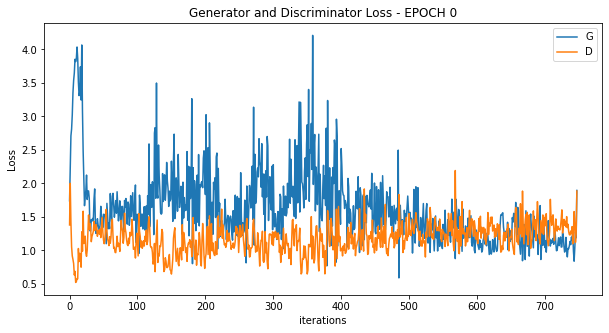

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


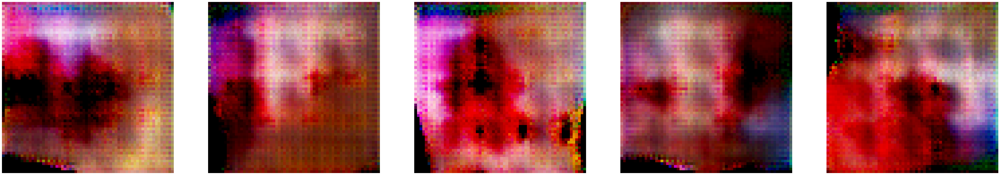

[2/100][374/748] Loss_D: 0.5813 Loss_G: 2.1133 D(x): 0.7099 D(G(z)): 0.1124 / 0.1270
[2/100][748/748] Loss_D: 0.7935 Loss_G: 5.8115 D(x): 0.9694 D(G(z)): 0.2953 / 0.0110



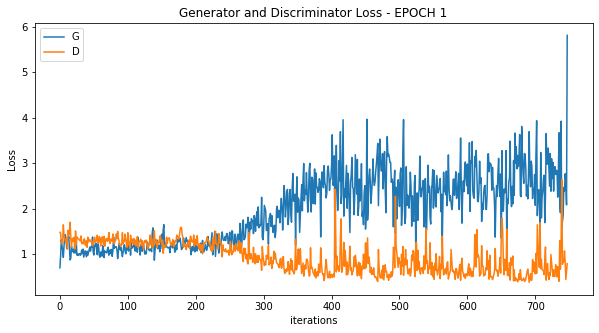

[3/100][374/748] Loss_D: 0.5934 Loss_G: 2.6010 D(x): 0.8607 D(G(z)): 0.2099 / 0.0730
[3/100][748/748] Loss_D: 4.5344 Loss_G: 4.4480 D(x): 0.0067 D(G(z)): 0.0002 / 0.0077



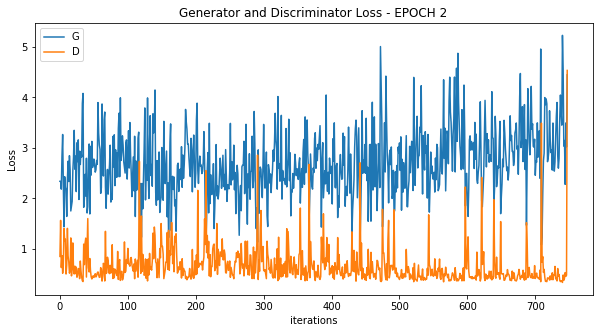

[4/100][374/748] Loss_D: 0.3982 Loss_G: 4.0078 D(x): 0.9197 D(G(z)): 0.0544 / 0.0177
[4/100][748/748] Loss_D: 0.6575 Loss_G: 5.7214 D(x): 0.9927 D(G(z)): 0.1243 / 0.0090



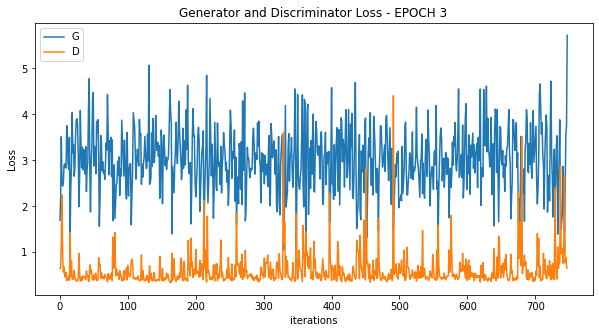

[5/100][374/748] Loss_D: 0.4557 Loss_G: 3.1833 D(x): 0.9639 D(G(z)): 0.0624 / 0.0402
[5/100][748/748] Loss_D: 0.9510 Loss_G: 2.4934 D(x): 0.3893 D(G(z)): 0.0504 / 0.0633



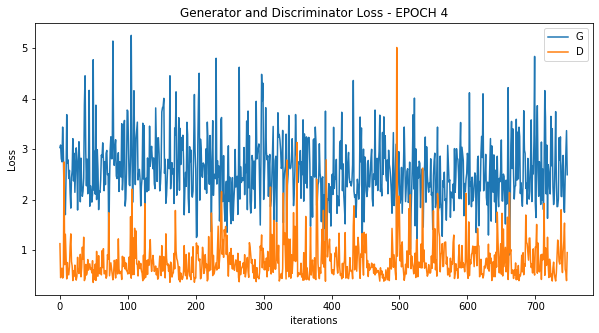

[6/100][374/748] Loss_D: 0.9273 Loss_G: 2.4469 D(x): 0.5395 D(G(z)): 0.2185 / 0.0753
[6/100][748/748] Loss_D: 0.5149 Loss_G: 4.8262 D(x): 0.9895 D(G(z)): 0.0081 / 0.0063



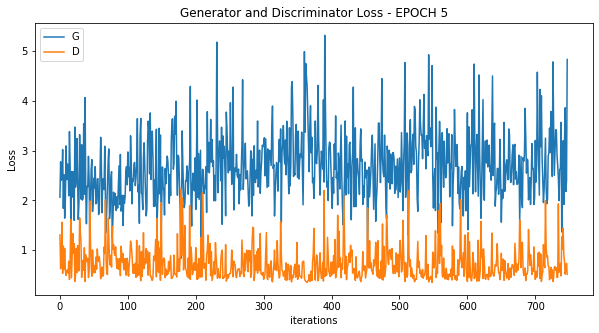

[7/100][374/748] Loss_D: 0.6313 Loss_G: 3.1611 D(x): 0.5999 D(G(z)): 0.0403 / 0.0382
[7/100][748/748] Loss_D: 2.4766 Loss_G: 4.2581 D(x): 0.0680 D(G(z)): 0.0010 / 0.0095



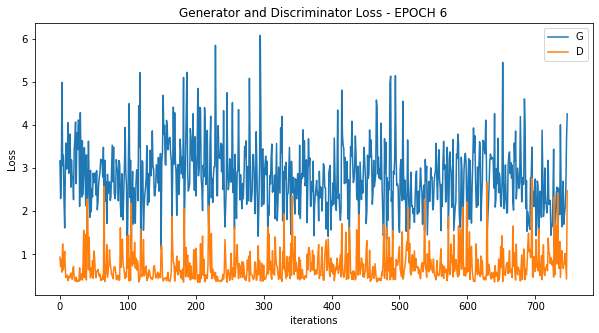

[8/100][374/748] Loss_D: 0.5235 Loss_G: 2.5822 D(x): 0.8946 D(G(z)): 0.1486 / 0.0686
[8/100][748/748] Loss_D: 1.4815 Loss_G: 4.4379 D(x): 0.2017 D(G(z)): 0.0012 / 0.0073



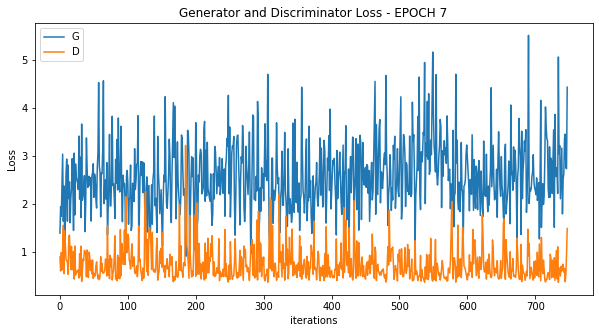

[9/100][374/748] Loss_D: 0.5362 Loss_G: 2.5985 D(x): 0.8347 D(G(z)): 0.1374 / 0.0756
[9/100][748/748] Loss_D: 0.3647 Loss_G: 5.9615 D(x): 0.8144 D(G(z)): 0.0014 / 0.0023



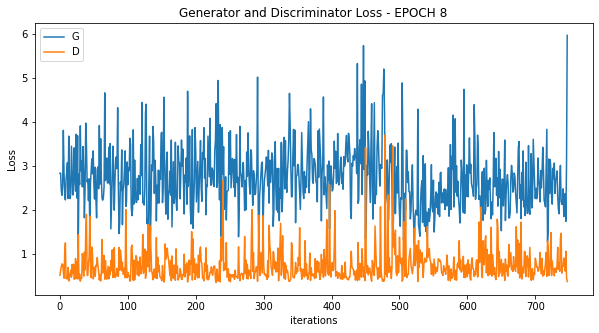

[10/100][374/748] Loss_D: 0.6553 Loss_G: 2.2419 D(x): 0.6789 D(G(z)): 0.1503 / 0.0983
[10/100][748/748] Loss_D: 5.5520 Loss_G: 7.2151 D(x): 0.0023 D(G(z)): 0.0001 / 0.0006



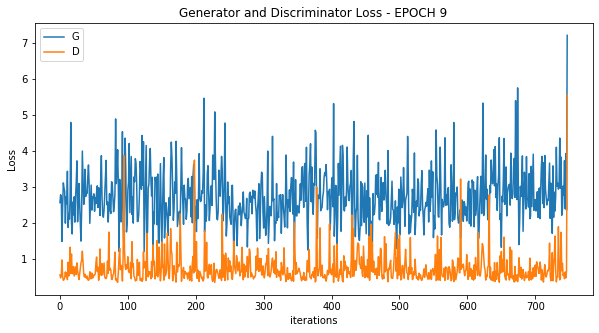

[11/100][374/748] Loss_D: 0.9636 Loss_G: 2.2689 D(x): 0.4497 D(G(z)): 0.0973 / 0.0932
[11/100][748/748] Loss_D: 2.9584 Loss_G: 5.0436 D(x): 0.0612 D(G(z)): 0.0004 / 0.0090



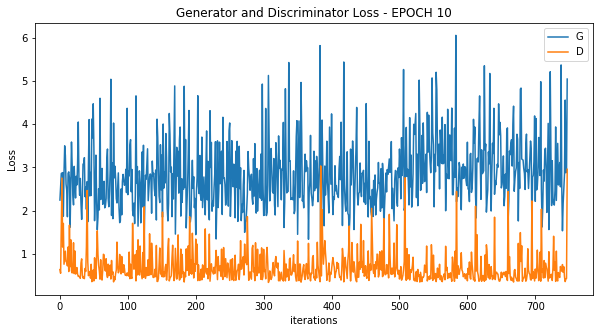

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


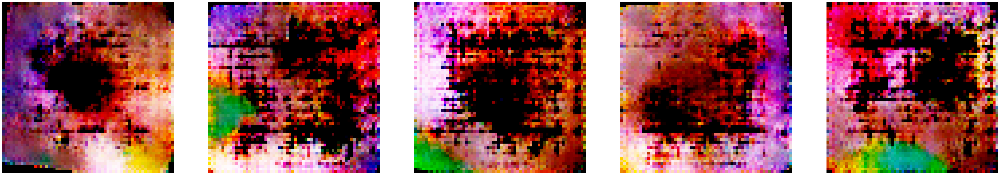

[12/100][374/748] Loss_D: 0.8361 Loss_G: 1.7701 D(x): 0.6721 D(G(z)): 0.2695 / 0.1599
[12/100][748/748] Loss_D: 1.6415 Loss_G: 3.3737 D(x): 0.2034 D(G(z)): 0.0066 / 0.0331



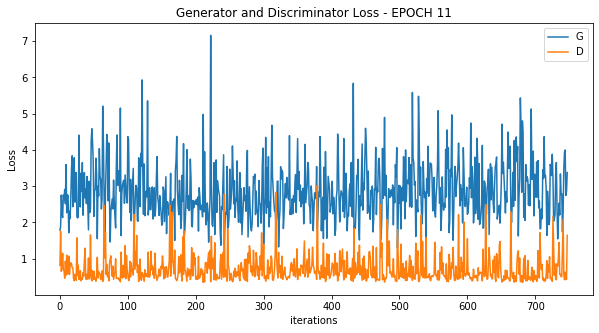

[13/100][374/748] Loss_D: 0.7053 Loss_G: 1.7552 D(x): 0.5863 D(G(z)): 0.0854 / 0.1786
[13/100][748/748] Loss_D: 0.3955 Loss_G: 5.0982 D(x): 0.8968 D(G(z)): 0.0126 / 0.0046



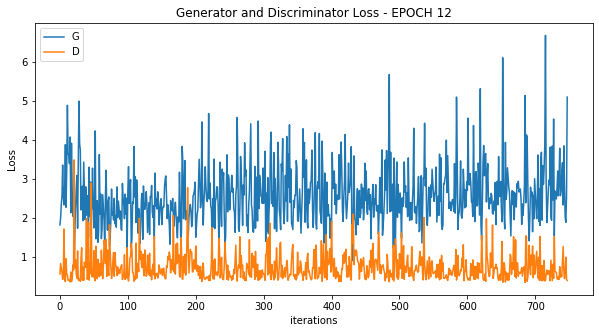

[14/100][374/748] Loss_D: 0.4039 Loss_G: 2.9089 D(x): 0.8873 D(G(z)): 0.0612 / 0.0441
[14/100][748/748] Loss_D: 0.3319 Loss_G: 6.8196 D(x): 0.9274 D(G(z)): 0.0008 / 0.0006



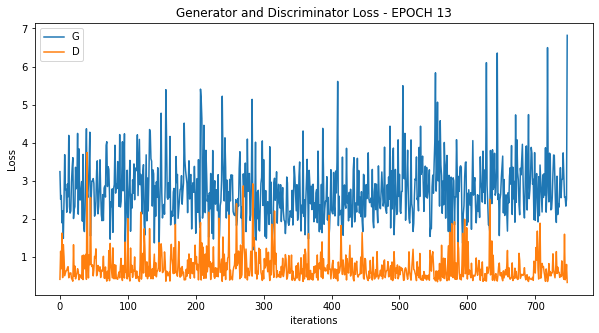

[15/100][374/748] Loss_D: 1.2827 Loss_G: 3.5499 D(x): 0.9845 D(G(z)): 0.5471 / 0.0236
[15/100][748/748] Loss_D: 0.3773 Loss_G: 5.4713 D(x): 0.8735 D(G(z)): 0.0017 / 0.0026



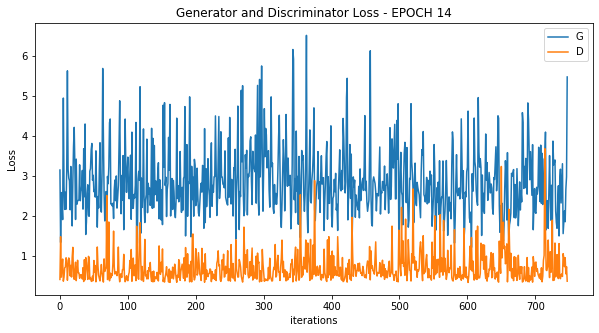

[16/100][374/748] Loss_D: 0.7208 Loss_G: 2.1513 D(x): 0.5801 D(G(z)): 0.1006 / 0.1057
[16/100][748/748] Loss_D: 0.4429 Loss_G: 8.4918 D(x): 0.9865 D(G(z)): 0.0001 / 0.0001



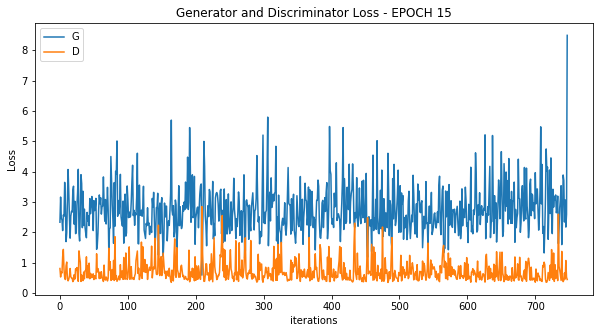

[17/100][374/748] Loss_D: 1.6770 Loss_G: 1.5264 D(x): 0.3083 D(G(z)): 0.3857 / 0.2225
[17/100][748/748] Loss_D: 0.8183 Loss_G: 6.3511 D(x): 0.6519 D(G(z)): 0.2680 / 0.0009



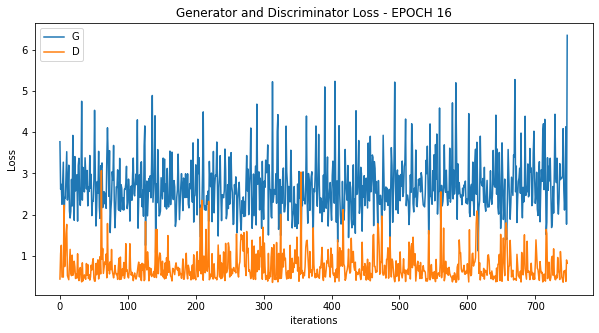

[18/100][374/748] Loss_D: 0.3774 Loss_G: 3.7324 D(x): 0.8965 D(G(z)): 0.0310 / 0.0199
[18/100][748/748] Loss_D: 0.3760 Loss_G: 5.1955 D(x): 0.8442 D(G(z)): 0.0076 / 0.0041



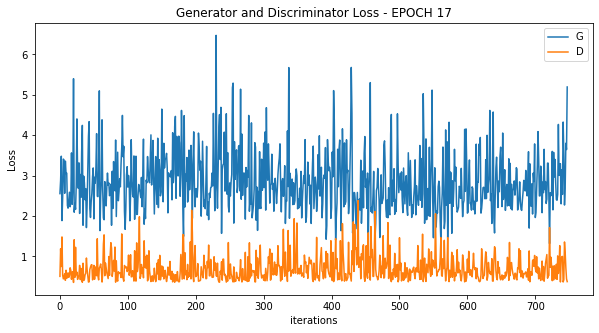

[19/100][374/748] Loss_D: 1.2521 Loss_G: 1.7448 D(x): 0.2953 D(G(z)): 0.0545 / 0.1631
[19/100][748/748] Loss_D: 0.3805 Loss_G: 7.4250 D(x): 0.7936 D(G(z)): 0.0002 / 0.0003



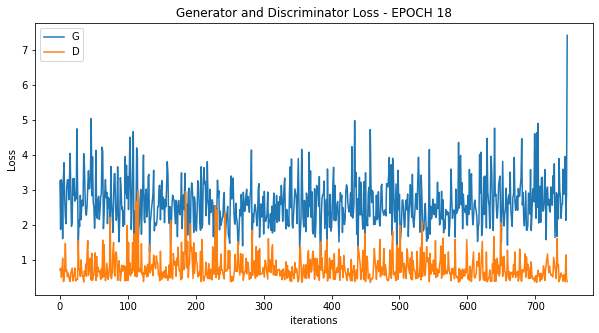

[20/100][374/748] Loss_D: 0.5583 Loss_G: 2.2490 D(x): 0.8160 D(G(z)): 0.1338 / 0.1011
[20/100][748/748] Loss_D: 0.3606 Loss_G: 4.4797 D(x): 0.8697 D(G(z)): 0.0120 / 0.0072



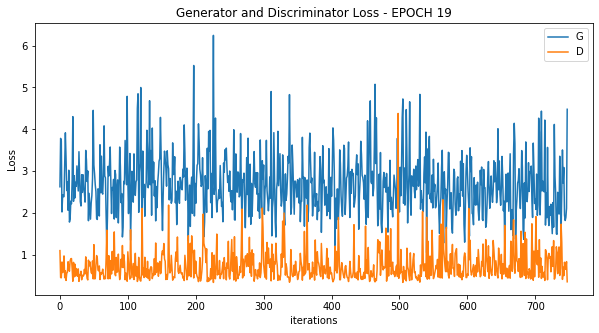

[21/100][374/748] Loss_D: 0.9283 Loss_G: 1.8971 D(x): 0.5313 D(G(z)): 0.1872 / 0.1411
[21/100][748/748] Loss_D: 0.7030 Loss_G: 5.5837 D(x): 0.5746 D(G(z)): 0.0014 / 0.0029



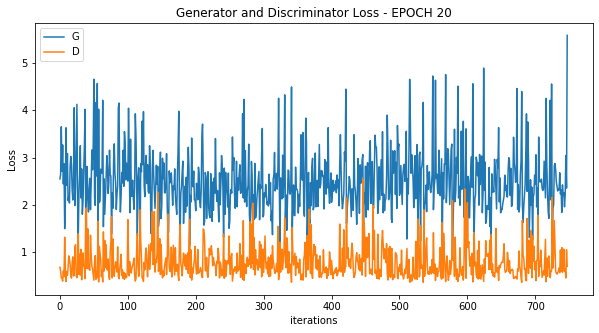

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


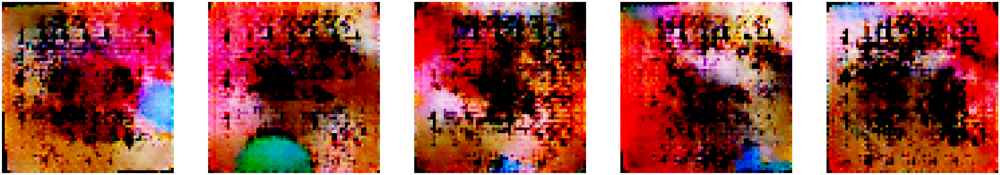

[22/100][374/748] Loss_D: 1.4171 Loss_G: 1.7893 D(x): 0.2694 D(G(z)): 0.0634 / 0.1756
[22/100][748/748] Loss_D: 0.4163 Loss_G: 5.0817 D(x): 0.9175 D(G(z)): 0.0766 / 0.0052



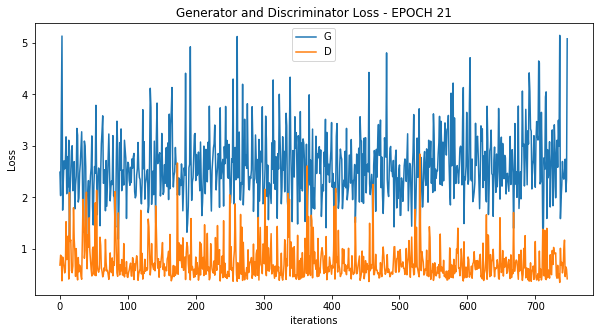

[23/100][374/748] Loss_D: 0.4697 Loss_G: 3.2019 D(x): 0.9200 D(G(z)): 0.0944 / 0.0323
[23/100][748/748] Loss_D: 0.4127 Loss_G: 4.4991 D(x): 0.7938 D(G(z)): 0.0421 / 0.0201



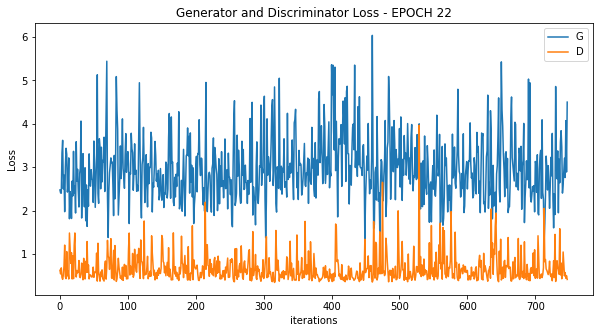

[24/100][374/748] Loss_D: 0.5815 Loss_G: 2.0446 D(x): 0.9635 D(G(z)): 0.1789 / 0.1276
[24/100][748/748] Loss_D: 0.4840 Loss_G: 5.1951 D(x): 0.9618 D(G(z)): 0.1121 / 0.0047



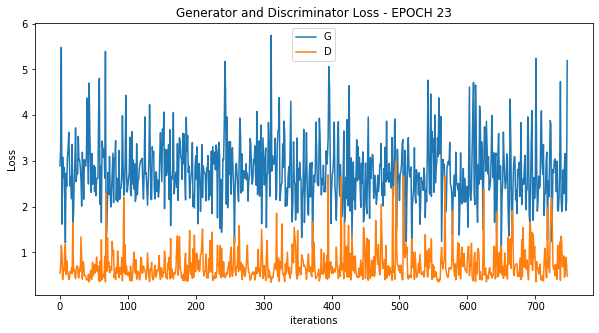

[25/100][374/748] Loss_D: 0.5697 Loss_G: 2.8657 D(x): 0.8581 D(G(z)): 0.1121 / 0.0543
[25/100][748/748] Loss_D: 3.7893 Loss_G: 4.8955 D(x): 0.0220 D(G(z)): 0.0015 / 0.0077



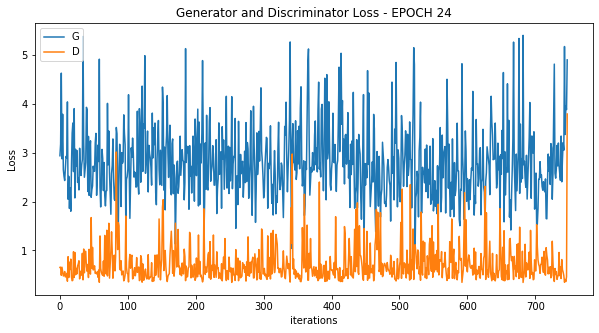

[26/100][374/748] Loss_D: 1.1042 Loss_G: 1.8935 D(x): 0.4172 D(G(z)): 0.1378 / 0.1376
[26/100][748/748] Loss_D: 0.3417 Loss_G: 5.7547 D(x): 0.9247 D(G(z)): 0.0030 / 0.0017



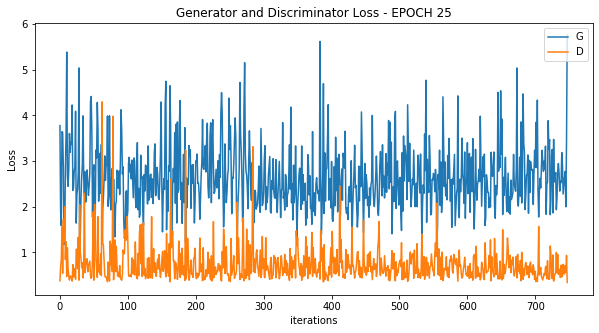

[27/100][374/748] Loss_D: 0.4963 Loss_G: 2.7010 D(x): 0.8904 D(G(z)): 0.1341 / 0.0549
[27/100][748/748] Loss_D: 0.4505 Loss_G: 3.7185 D(x): 0.9804 D(G(z)): 0.0250 / 0.0162



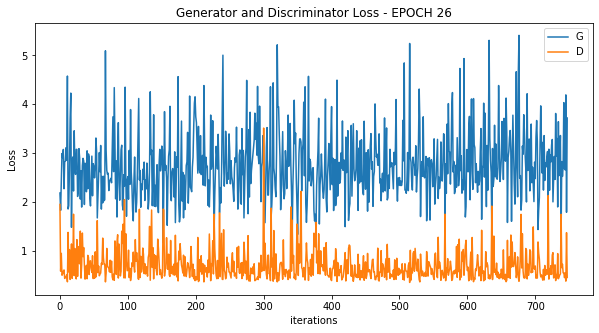

[28/100][374/748] Loss_D: 1.5714 Loss_G: 1.5439 D(x): 0.2279 D(G(z)): 0.0709 / 0.2114
[28/100][748/748] Loss_D: 2.7838 Loss_G: 1.8523 D(x): 0.0684 D(G(z)): 0.0157 / 0.1916



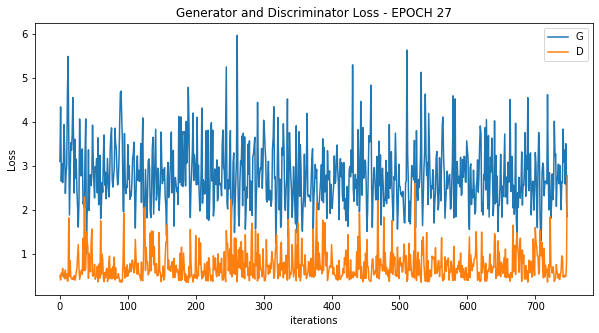

[29/100][374/748] Loss_D: 0.6617 Loss_G: 2.0199 D(x): 0.6863 D(G(z)): 0.1477 / 0.1300
[29/100][748/748] Loss_D: 0.6298 Loss_G: 4.9111 D(x): 0.6131 D(G(z)): 0.0043 / 0.0068



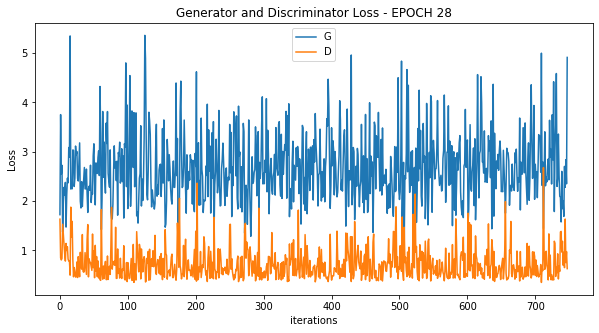

[30/100][374/748] Loss_D: 0.9157 Loss_G: 2.0926 D(x): 0.6181 D(G(z)): 0.2795 / 0.1197
[30/100][748/748] Loss_D: 3.9958 Loss_G: 4.0297 D(x): 0.0362 D(G(z)): 0.0236 / 0.0114



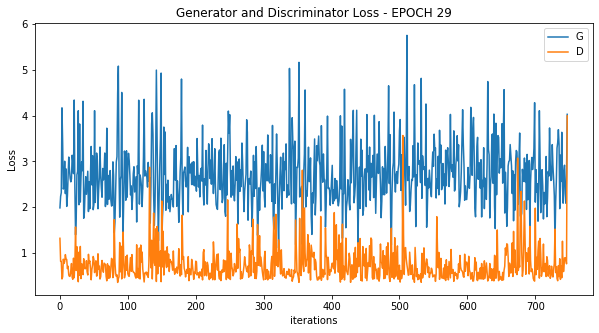

[31/100][374/748] Loss_D: 0.9059 Loss_G: 2.6647 D(x): 0.4382 D(G(z)): 0.0437 / 0.0652
[31/100][748/748] Loss_D: 5.6859 Loss_G: 3.2705 D(x): 0.0034 D(G(z)): 0.0205 / 0.0265



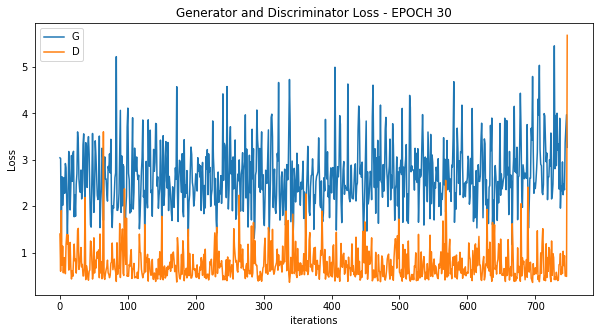

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


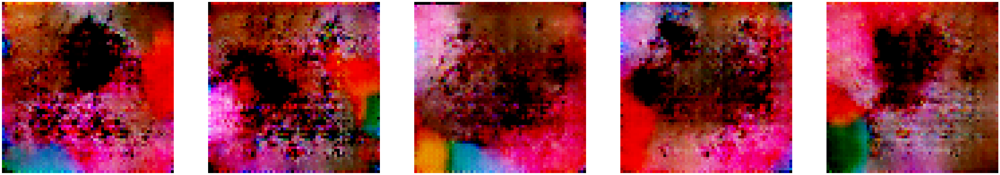

[32/100][374/748] Loss_D: 0.5917 Loss_G: 2.5841 D(x): 0.9790 D(G(z)): 0.1555 / 0.0698
[32/100][748/748] Loss_D: 0.5173 Loss_G: 7.0198 D(x): 0.6638 D(G(z)): 0.0008 / 0.0006



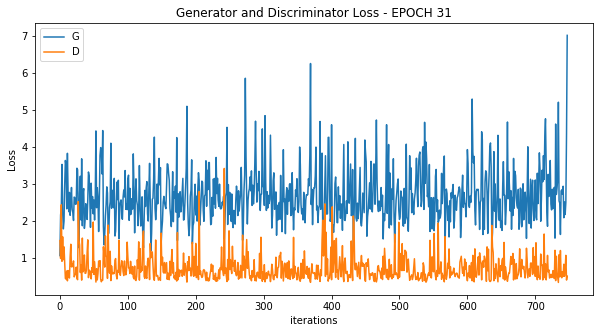

[33/100][374/748] Loss_D: 0.7626 Loss_G: 3.1872 D(x): 0.5248 D(G(z)): 0.0539 / 0.0379
[33/100][748/748] Loss_D: 0.6917 Loss_G: 9.0667 D(x): 0.9989 D(G(z)): 0.0001 / 0.0001



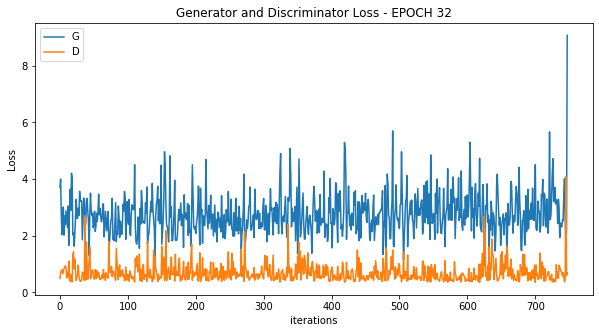

[34/100][374/748] Loss_D: 0.5072 Loss_G: 3.6265 D(x): 0.7184 D(G(z)): 0.0456 / 0.0266
[34/100][748/748] Loss_D: 1.1915 Loss_G: 4.4069 D(x): 0.3393 D(G(z)): 0.0032 / 0.0086



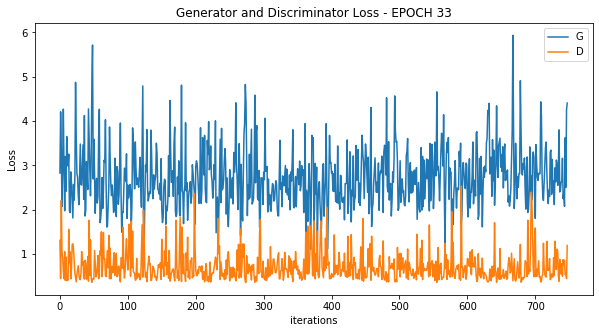

[35/100][374/748] Loss_D: 1.5234 Loss_G: 1.7975 D(x): 0.8769 D(G(z)): 0.6625 / 0.1612
[35/100][748/748] Loss_D: 1.3920 Loss_G: 1.7788 D(x): 0.2933 D(G(z)): 0.0841 / 0.3118



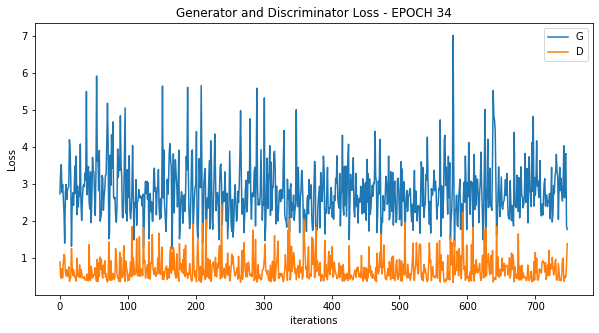

[36/100][374/748] Loss_D: 1.0958 Loss_G: 2.7653 D(x): 0.9599 D(G(z)): 0.4680 / 0.0577
[36/100][748/748] Loss_D: 1.0118 Loss_G: 2.4306 D(x): 0.4033 D(G(z)): 0.0476 / 0.0817



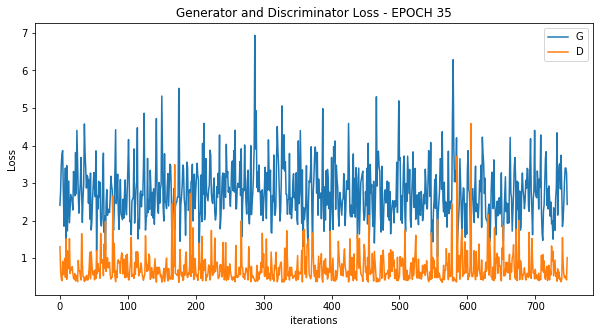

[37/100][374/748] Loss_D: 0.5961 Loss_G: 2.6727 D(x): 0.6416 D(G(z)): 0.0461 / 0.0705
[37/100][748/748] Loss_D: 0.4001 Loss_G: 3.9649 D(x): 0.9054 D(G(z)): 0.0717 / 0.0125



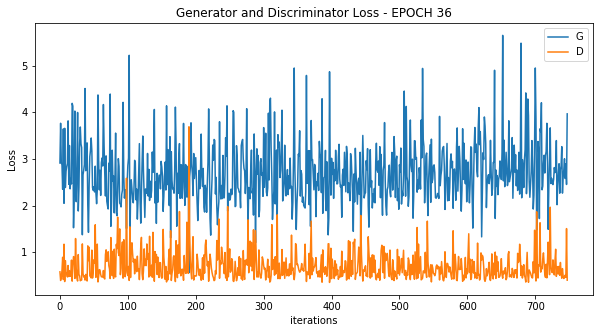

[38/100][374/748] Loss_D: 0.4392 Loss_G: 2.7683 D(x): 0.9334 D(G(z)): 0.0668 / 0.0531
[38/100][748/748] Loss_D: 1.0610 Loss_G: 4.9821 D(x): 0.3609 D(G(z)): 0.0024 / 0.0047



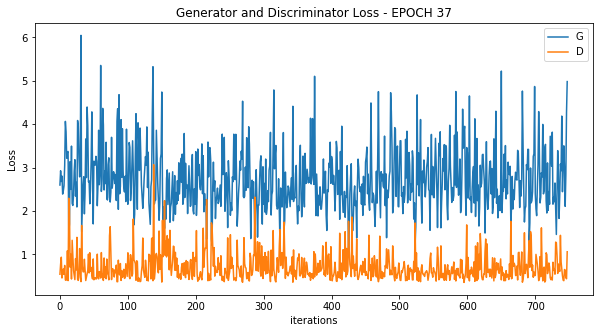

[39/100][374/748] Loss_D: 0.4206 Loss_G: 2.6573 D(x): 0.9268 D(G(z)): 0.0675 / 0.0676
[39/100][748/748] Loss_D: 1.0039 Loss_G: 7.0645 D(x): 0.5443 D(G(z)): 0.1425 / 0.0006



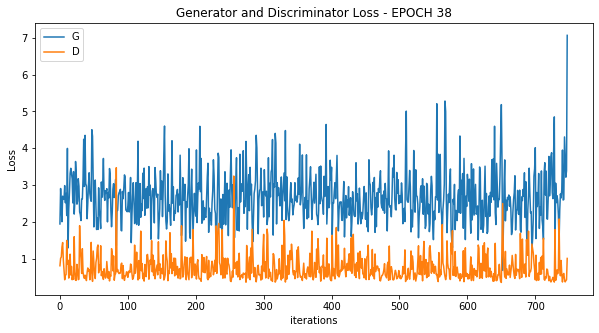

[40/100][374/748] Loss_D: 0.7881 Loss_G: 2.9286 D(x): 0.5067 D(G(z)): 0.0437 / 0.0503
[40/100][748/748] Loss_D: 0.4921 Loss_G: 4.8464 D(x): 0.9851 D(G(z)): 0.0283 / 0.0046



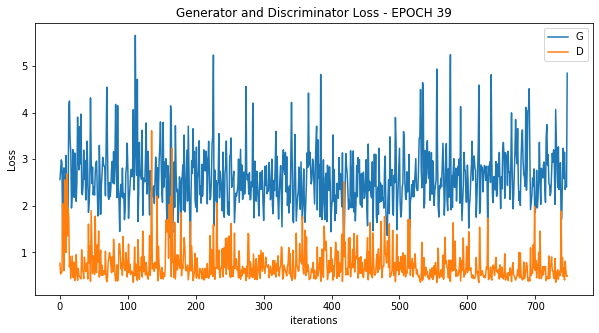

[41/100][374/748] Loss_D: 1.0650 Loss_G: 2.8250 D(x): 0.8106 D(G(z)): 0.4626 / 0.0503
[41/100][748/748] Loss_D: 0.4460 Loss_G: 9.9075 D(x): 0.9868 D(G(z)): 0.0001 / 0.0000



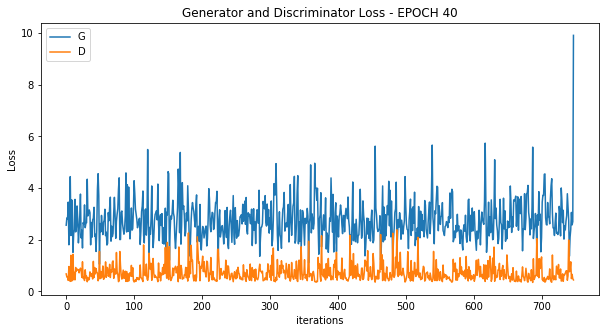

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


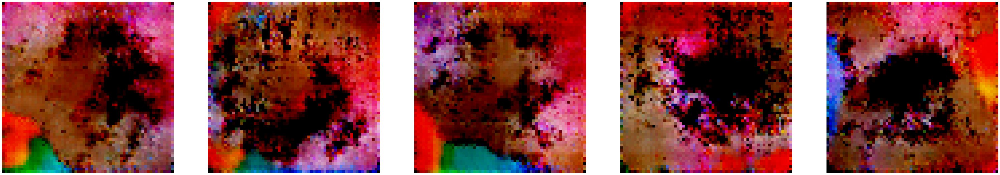

[42/100][374/748] Loss_D: 1.0941 Loss_G: 2.0270 D(x): 0.3674 D(G(z)): 0.0619 / 0.1278
[42/100][748/748] Loss_D: 0.6124 Loss_G: 2.7636 D(x): 0.5648 D(G(z)): 0.0105 / 0.0467



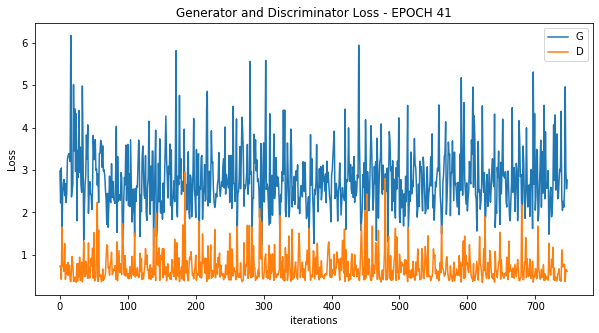

[43/100][374/748] Loss_D: 0.5120 Loss_G: 2.3211 D(x): 0.7394 D(G(z)): 0.0667 / 0.0904
[43/100][748/748] Loss_D: 0.5503 Loss_G: 5.5012 D(x): 0.9955 D(G(z)): 0.0039 / 0.0025



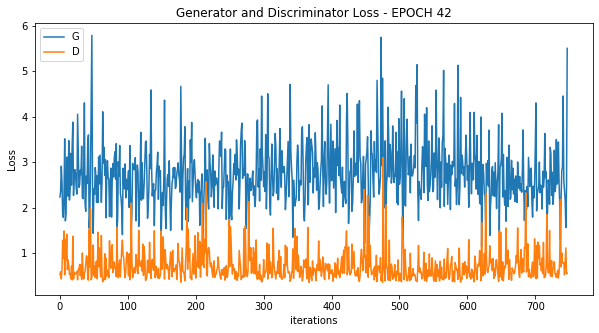

[44/100][374/748] Loss_D: 0.9079 Loss_G: 1.8410 D(x): 0.7490 D(G(z)): 0.3604 / 0.1477
[44/100][748/748] Loss_D: 0.6969 Loss_G: 4.5088 D(x): 0.9984 D(G(z)): 0.0475 / 0.0068



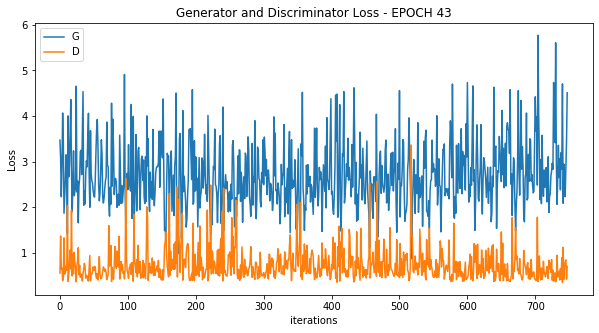

[45/100][374/748] Loss_D: 0.4705 Loss_G: 2.8569 D(x): 0.8017 D(G(z)): 0.0851 / 0.0559
[45/100][748/748] Loss_D: 2.1483 Loss_G: 6.9744 D(x): 0.0967 D(G(z)): 0.0000 / 0.0004



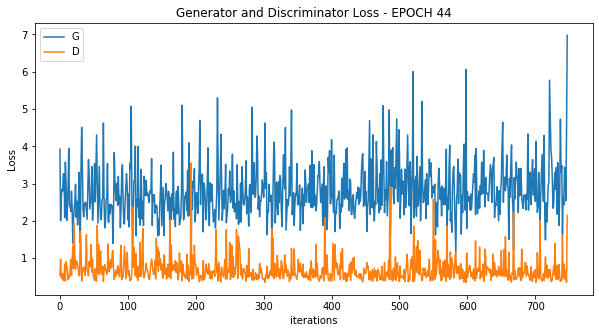

[46/100][374/748] Loss_D: 0.5817 Loss_G: 2.3053 D(x): 0.8833 D(G(z)): 0.1645 / 0.0940
[46/100][748/748] Loss_D: 0.9192 Loss_G: 3.4850 D(x): 0.4043 D(G(z)): 0.0072 / 0.0339



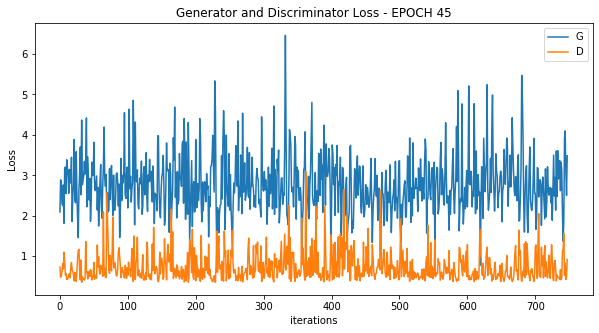

[47/100][374/748] Loss_D: 0.7921 Loss_G: 2.3536 D(x): 0.9715 D(G(z)): 0.3093 / 0.0848
[47/100][748/748] Loss_D: 1.7283 Loss_G: 15.8301 D(x): 0.8455 D(G(z)): 0.7290 / 0.0000



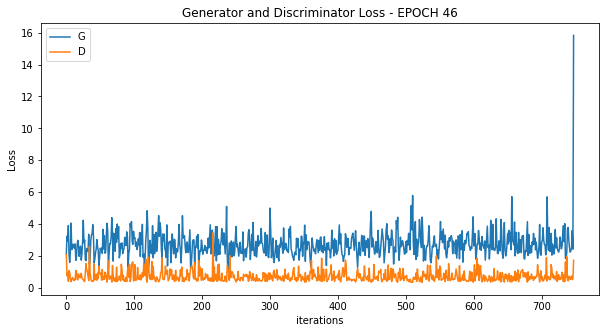

[48/100][374/748] Loss_D: 1.2062 Loss_G: 2.6230 D(x): 0.9491 D(G(z)): 0.5305 / 0.0647
[48/100][748/748] Loss_D: 1.5998 Loss_G: 1.9839 D(x): 0.1747 D(G(z)): 0.0083 / 0.1293



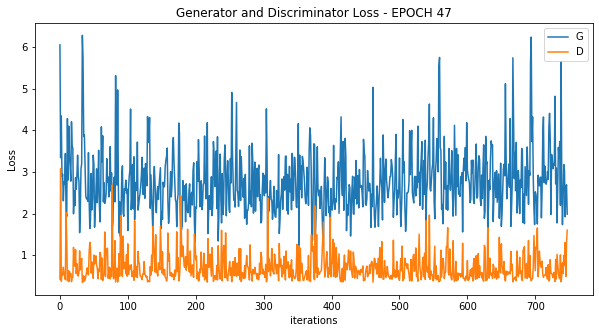

[49/100][374/748] Loss_D: 1.2500 Loss_G: 1.4087 D(x): 0.4651 D(G(z)): 0.3422 / 0.2353
[49/100][748/748] Loss_D: 0.3479 Loss_G: 8.9805 D(x): 0.8897 D(G(z)): 0.0000 / 0.0000



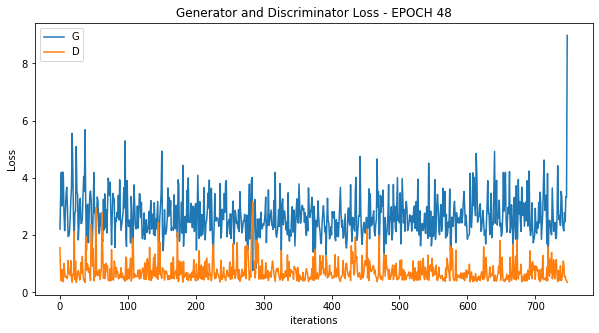

[50/100][374/748] Loss_D: 0.6553 Loss_G: 2.6986 D(x): 0.5928 D(G(z)): 0.0474 / 0.0590
[50/100][748/748] Loss_D: 0.6134 Loss_G: 5.5623 D(x): 0.5672 D(G(z)): 0.0009 / 0.0075



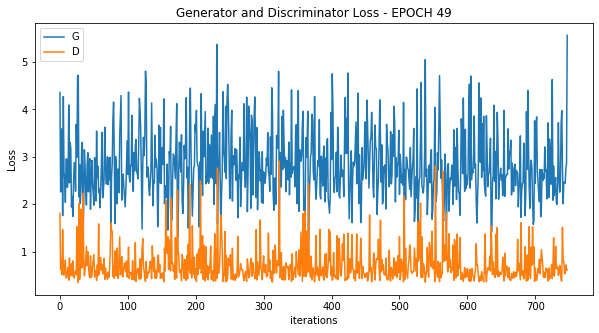

[51/100][374/748] Loss_D: 1.2061 Loss_G: 1.8303 D(x): 0.4513 D(G(z)): 0.2849 / 0.1563
[51/100][748/748] Loss_D: 0.8967 Loss_G: 4.4849 D(x): 0.4612 D(G(z)): 0.0061 / 0.0636



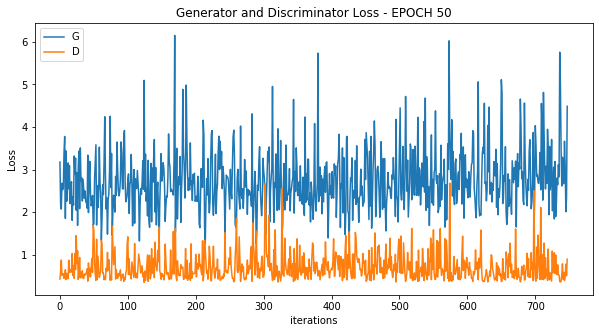

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


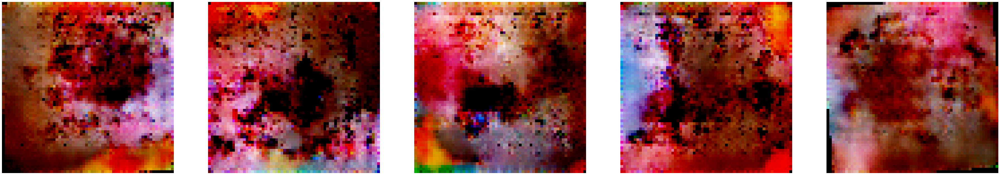

[52/100][374/748] Loss_D: 0.7659 Loss_G: 2.2726 D(x): 0.9018 D(G(z)): 0.3028 / 0.1061
[52/100][748/748] Loss_D: 4.0193 Loss_G: 4.3003 D(x): 0.0116 D(G(z)): 0.0003 / 0.0090



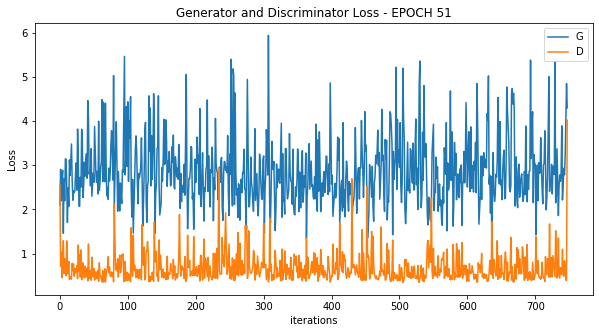

[53/100][374/748] Loss_D: 1.4394 Loss_G: 2.2440 D(x): 0.2471 D(G(z)): 0.0434 / 0.0998
[53/100][748/748] Loss_D: 0.8762 Loss_G: 5.3211 D(x): 0.9997 D(G(z)): 0.0057 / 0.0036



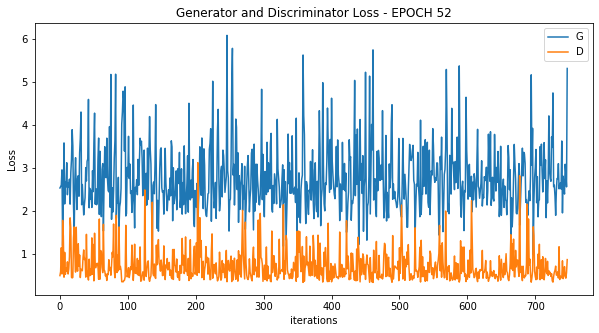

[54/100][374/748] Loss_D: 0.4568 Loss_G: 3.0786 D(x): 0.9452 D(G(z)): 0.0921 / 0.0410
[54/100][748/748] Loss_D: 0.3525 Loss_G: 5.5147 D(x): 0.9386 D(G(z)): 0.0157 / 0.0042



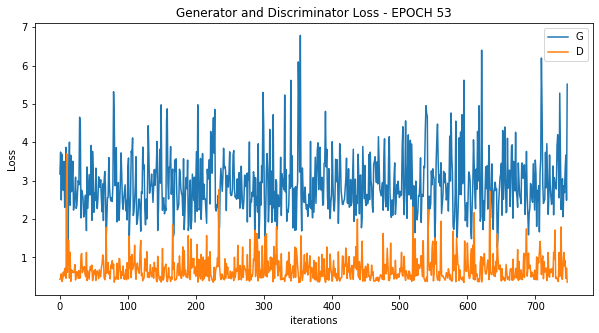

[55/100][374/748] Loss_D: 0.4883 Loss_G: 2.3531 D(x): 0.9319 D(G(z)): 0.1154 / 0.0890
[55/100][748/748] Loss_D: 0.3592 Loss_G: 6.7904 D(x): 0.9595 D(G(z)): 0.0007 / 0.0006



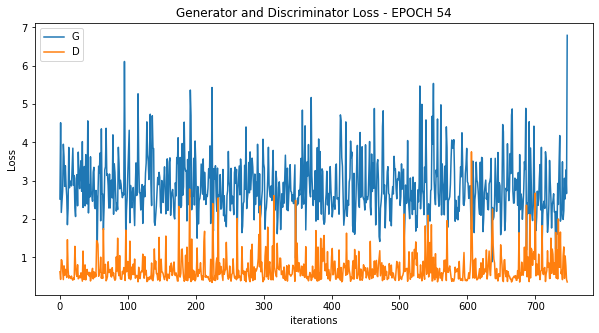

[56/100][374/748] Loss_D: 0.5679 Loss_G: 2.8109 D(x): 0.6648 D(G(z)): 0.0483 / 0.0602
[56/100][748/748] Loss_D: 0.4767 Loss_G: 6.7868 D(x): 0.9899 D(G(z)): 0.0010 / 0.0006



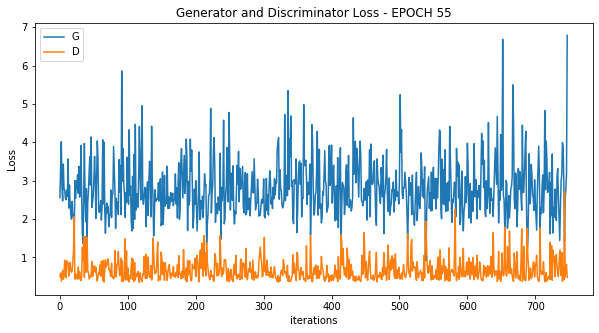

[57/100][374/748] Loss_D: 1.5215 Loss_G: 1.8293 D(x): 0.9612 D(G(z)): 0.6252 / 0.1568
[57/100][748/748] Loss_D: 4.9061 Loss_G: 7.1725 D(x): 0.0060 D(G(z)): 0.0000 / 0.0004



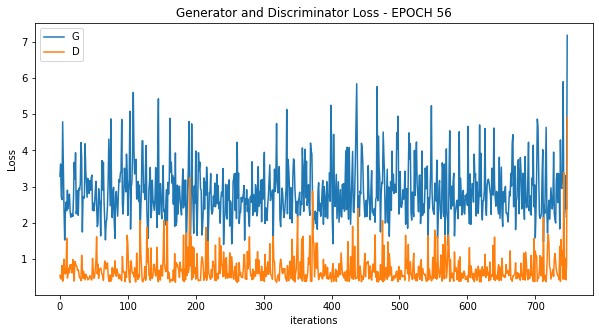

[58/100][374/748] Loss_D: 0.4324 Loss_G: 3.0653 D(x): 0.9395 D(G(z)): 0.0657 / 0.0401
[58/100][748/748] Loss_D: 0.5593 Loss_G: 6.0056 D(x): 0.7347 D(G(z)): 0.0014 / 0.0013



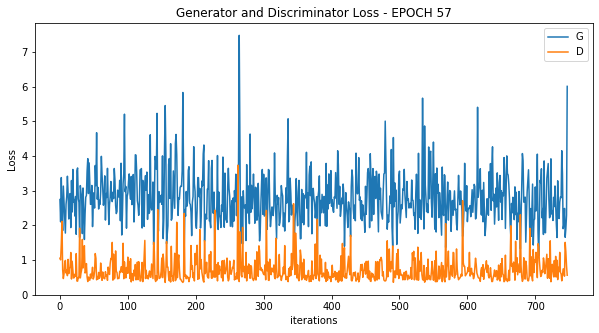

[59/100][374/748] Loss_D: 0.8935 Loss_G: 2.1257 D(x): 0.9185 D(G(z)): 0.4037 / 0.1005
[59/100][748/748] Loss_D: 4.8739 Loss_G: 5.7804 D(x): 0.0045 D(G(z)): 0.0001 / 0.0019



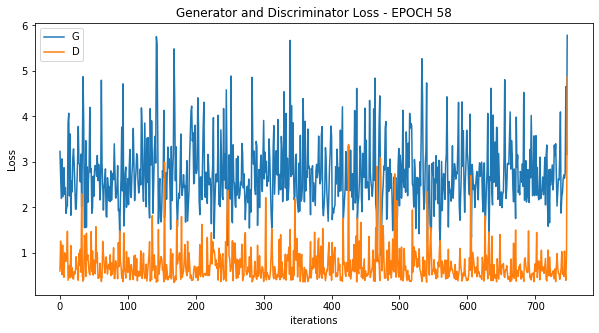

[60/100][374/748] Loss_D: 0.6402 Loss_G: 2.9599 D(x): 0.6528 D(G(z)): 0.0991 / 0.0440
[60/100][748/748] Loss_D: 0.4181 Loss_G: 3.3901 D(x): 0.8635 D(G(z)): 0.0329 / 0.0233



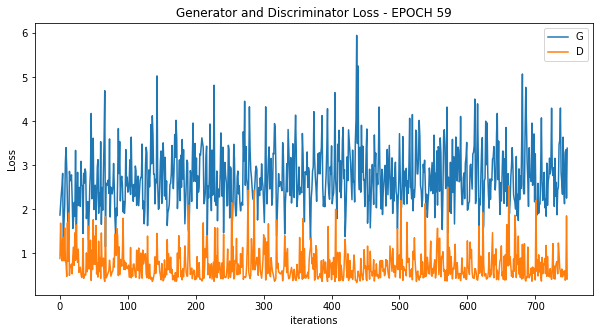

[61/100][374/748] Loss_D: 0.7195 Loss_G: 2.4718 D(x): 0.5648 D(G(z)): 0.0762 / 0.0870
[61/100][748/748] Loss_D: 0.8218 Loss_G: 3.2408 D(x): 0.4706 D(G(z)): 0.0568 / 0.0274



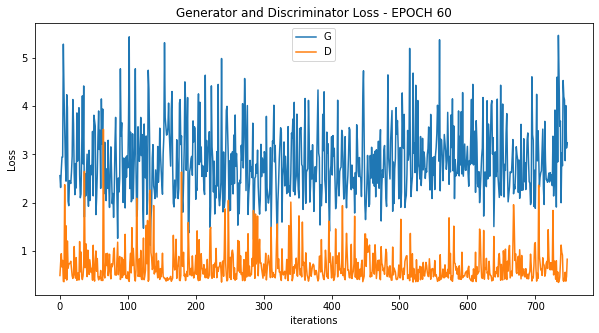

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


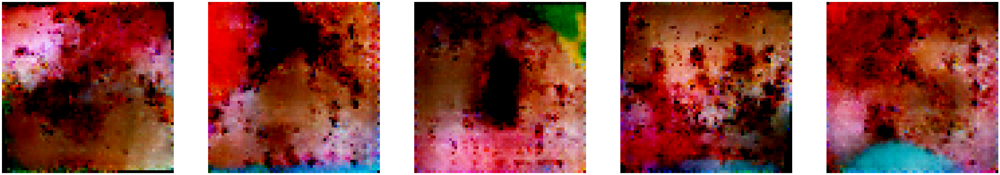

[62/100][374/748] Loss_D: 1.2480 Loss_G: 2.1479 D(x): 0.7636 D(G(z)): 0.5370 / 0.1131
[62/100][748/748] Loss_D: 1.8316 Loss_G: 9.2620 D(x): 0.9455 D(G(z)): 0.5144 / 0.0364



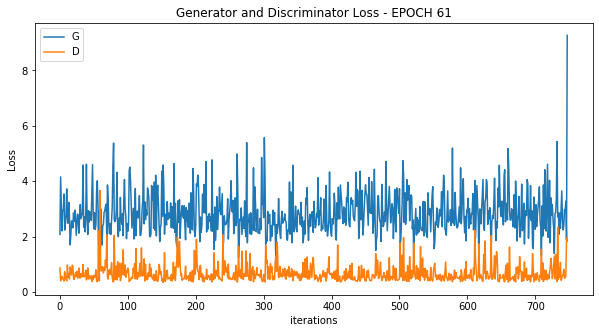

[63/100][374/748] Loss_D: 0.5320 Loss_G: 3.1279 D(x): 0.6969 D(G(z)): 0.0479 / 0.0368
[63/100][748/748] Loss_D: 0.3639 Loss_G: 4.4392 D(x): 0.8994 D(G(z)): 0.0228 / 0.0073



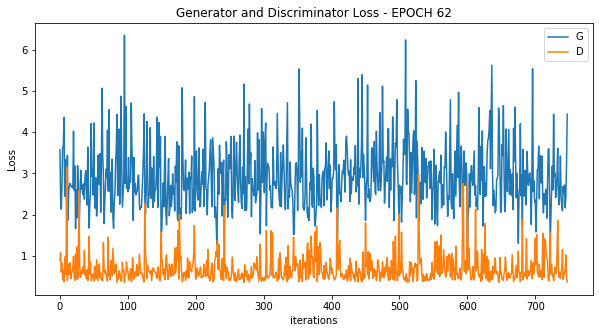

[64/100][374/748] Loss_D: 2.0192 Loss_G: 1.6013 D(x): 0.1457 D(G(z)): 0.0793 / 0.1879
[64/100][748/748] Loss_D: 1.1429 Loss_G: 8.1916 D(x): 0.3832 D(G(z)): 0.0001 / 0.0002



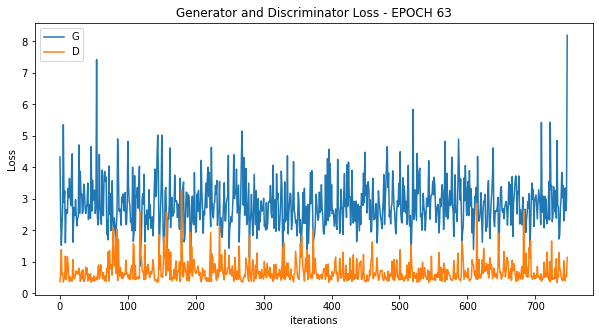

[65/100][374/748] Loss_D: 0.4729 Loss_G: 2.3632 D(x): 0.8732 D(G(z)): 0.1134 / 0.0846
[65/100][748/748] Loss_D: 1.0784 Loss_G: 3.7854 D(x): 0.3600 D(G(z)): 0.0049 / 0.0185



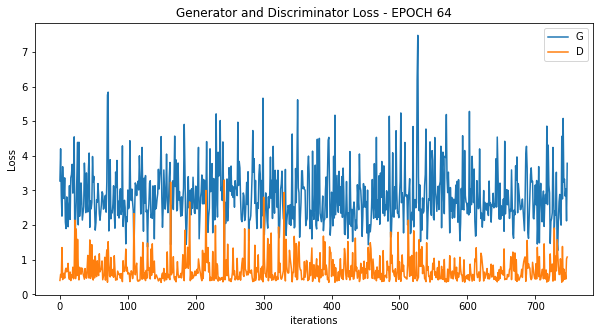

[66/100][374/748] Loss_D: 0.6967 Loss_G: 2.6427 D(x): 0.9705 D(G(z)): 0.2093 / 0.0662
[66/100][748/748] Loss_D: 2.7278 Loss_G: 4.7625 D(x): 0.0553 D(G(z)): 0.0007 / 0.0051



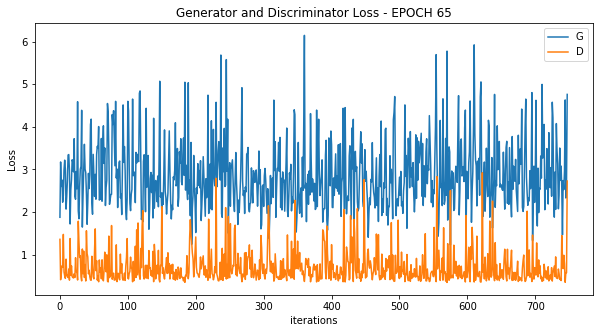

[67/100][374/748] Loss_D: 0.3704 Loss_G: 3.7083 D(x): 0.8859 D(G(z)): 0.0271 / 0.0221
[67/100][748/748] Loss_D: 1.7223 Loss_G: 9.5322 D(x): 0.1582 D(G(z)): 0.0000 / 0.0000



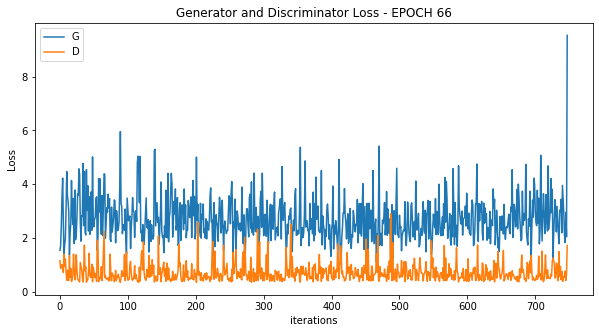

[68/100][374/748] Loss_D: 0.4165 Loss_G: 2.7708 D(x): 0.8449 D(G(z)): 0.0545 / 0.0539
[68/100][748/748] Loss_D: 0.6991 Loss_G: 8.4598 D(x): 0.5016 D(G(z)): 0.0000 / 0.0001



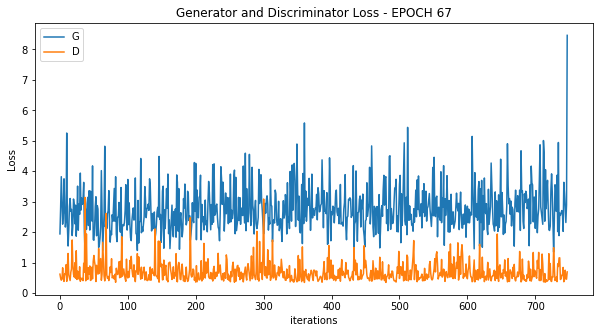

[69/100][374/748] Loss_D: 0.4224 Loss_G: 3.5039 D(x): 0.7856 D(G(z)): 0.0296 / 0.0251
[69/100][748/748] Loss_D: 0.3813 Loss_G: 4.8639 D(x): 0.8622 D(G(z)): 0.0069 / 0.0045



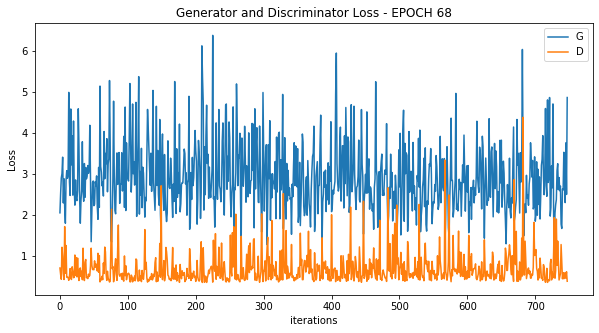

[70/100][374/748] Loss_D: 0.4547 Loss_G: 2.4858 D(x): 0.8165 D(G(z)): 0.0680 / 0.0749
[70/100][748/748] Loss_D: 0.5676 Loss_G: 10.7458 D(x): 0.9846 D(G(z)): 0.0000 / 0.0000



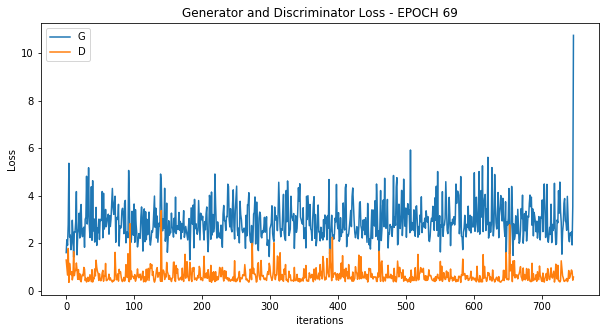

[71/100][374/748] Loss_D: 0.4459 Loss_G: 2.8667 D(x): 0.8143 D(G(z)): 0.0706 / 0.0530
[71/100][748/748] Loss_D: 0.4211 Loss_G: 5.4331 D(x): 0.9731 D(G(z)): 0.0328 / 0.0025



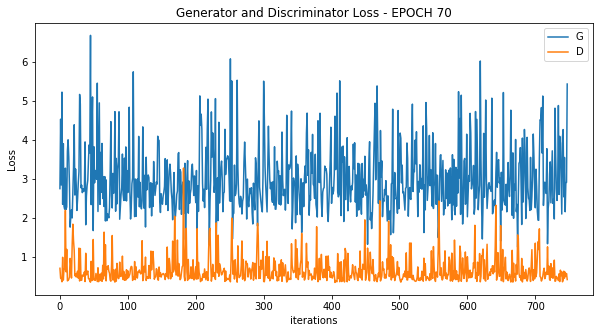

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


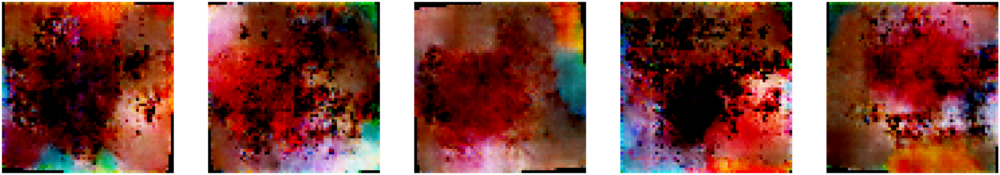

[72/100][374/748] Loss_D: 0.5190 Loss_G: 3.2908 D(x): 0.8962 D(G(z)): 0.1306 / 0.0300
[72/100][748/748] Loss_D: 1.6305 Loss_G: 4.7889 D(x): 0.3215 D(G(z)): 0.0884 / 0.1576



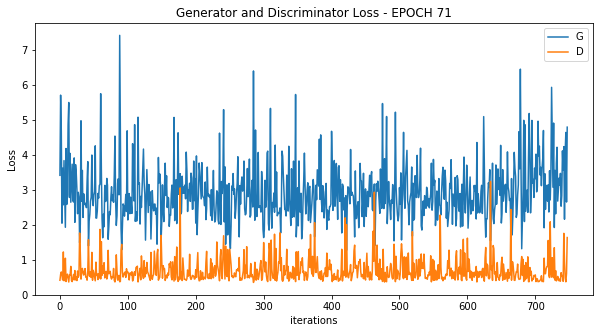

[73/100][374/748] Loss_D: 0.3808 Loss_G: 4.3596 D(x): 0.9392 D(G(z)): 0.0167 / 0.0110
[73/100][748/748] Loss_D: 0.9775 Loss_G: 8.0642 D(x): 0.3966 D(G(z)): 0.0001 / 0.0002



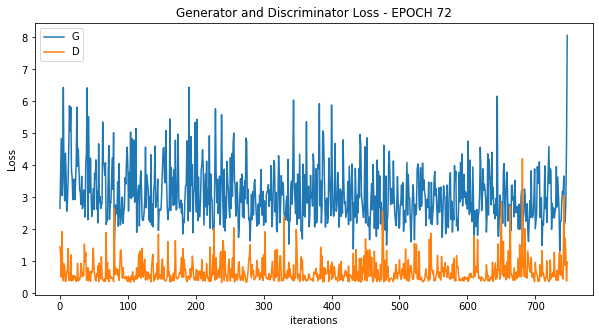

[74/100][374/748] Loss_D: 0.6349 Loss_G: 2.5309 D(x): 0.8233 D(G(z)): 0.1844 / 0.0785
[74/100][748/748] Loss_D: 1.6089 Loss_G: 5.6326 D(x): 0.1714 D(G(z)): 0.0009 / 0.0019



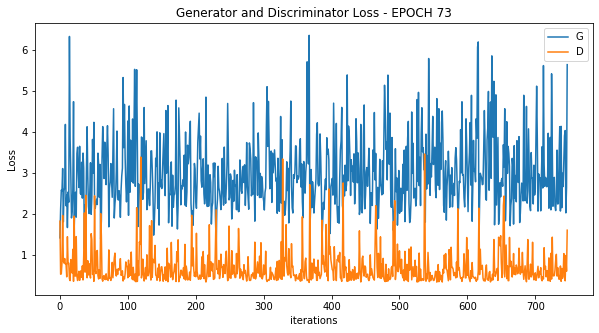

[75/100][374/748] Loss_D: 0.5110 Loss_G: 2.6115 D(x): 0.9283 D(G(z)): 0.1343 / 0.0598
[75/100][748/748] Loss_D: 1.3914 Loss_G: 10.9156 D(x): 0.3179 D(G(z)): 0.0000 / 0.0000



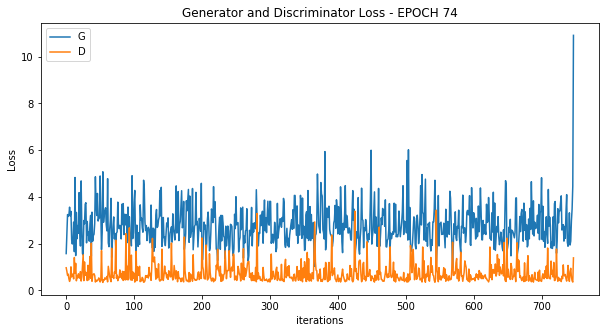

[76/100][374/748] Loss_D: 0.5327 Loss_G: 2.6288 D(x): 0.9494 D(G(z)): 0.1406 / 0.0623
[76/100][748/748] Loss_D: 1.0542 Loss_G: 4.2727 D(x): 0.3814 D(G(z)): 0.0032 / 0.0107



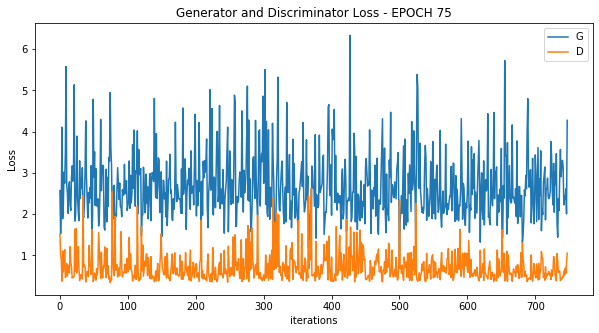

[77/100][374/748] Loss_D: 0.7525 Loss_G: 2.3959 D(x): 0.6347 D(G(z)): 0.1763 / 0.0889
[77/100][748/748] Loss_D: 0.7605 Loss_G: 9.5249 D(x): 0.4809 D(G(z)): 0.0000 / 0.0000



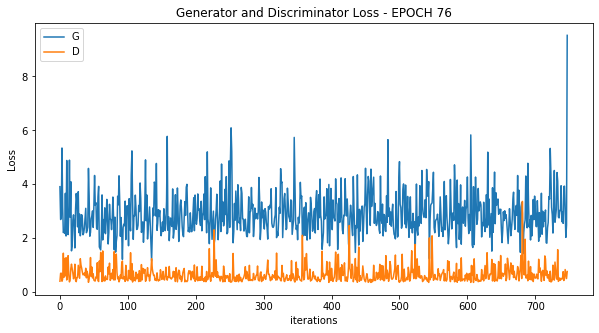

[78/100][374/748] Loss_D: 0.4792 Loss_G: 3.3323 D(x): 0.7559 D(G(z)): 0.0413 / 0.0313
[78/100][748/748] Loss_D: 1.7603 Loss_G: 5.5648 D(x): 0.1545 D(G(z)): 0.0019 / 0.0052



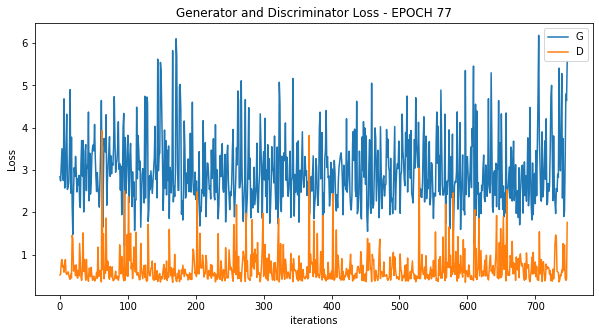

[79/100][374/748] Loss_D: 0.9398 Loss_G: 1.8544 D(x): 0.7627 D(G(z)): 0.3820 / 0.1476
[79/100][748/748] Loss_D: 0.8090 Loss_G: 8.9048 D(x): 0.4710 D(G(z)): 0.0000 / 0.0001



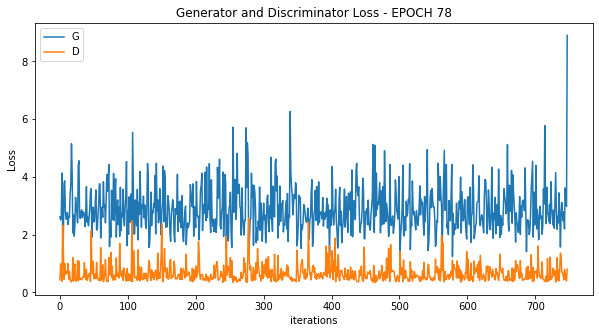

[80/100][374/748] Loss_D: 0.7612 Loss_G: 3.8580 D(x): 0.4966 D(G(z)): 0.0108 / 0.0174
[80/100][748/748] Loss_D: 2.3607 Loss_G: 6.8931 D(x): 0.3287 D(G(z)): 0.0002 / 0.0025



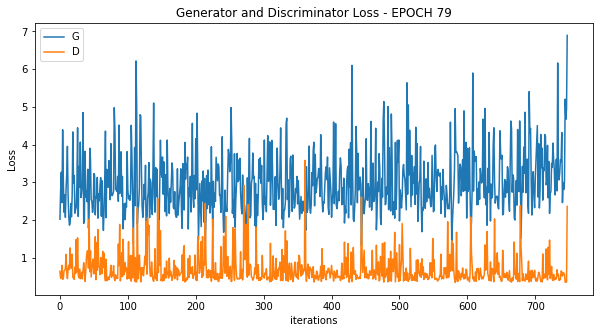

[81/100][374/748] Loss_D: 0.5896 Loss_G: 2.2235 D(x): 0.8699 D(G(z)): 0.2007 / 0.0998
[81/100][748/748] Loss_D: 1.8489 Loss_G: 10.9997 D(x): 0.3718 D(G(z)): 0.4826 / 0.0000



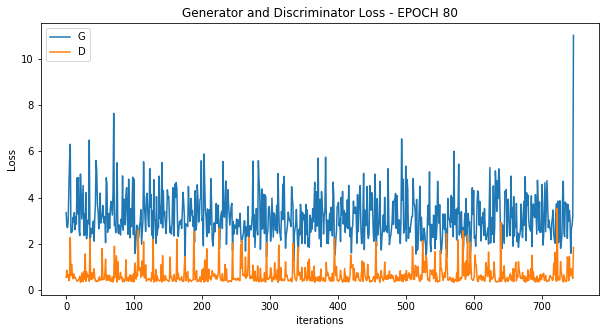

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


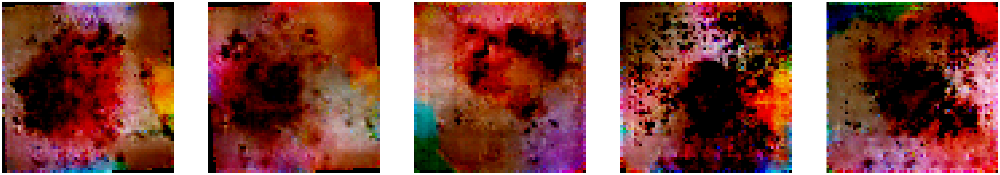

[82/100][374/748] Loss_D: 0.7320 Loss_G: 2.0890 D(x): 0.6413 D(G(z)): 0.1739 / 0.1188
[82/100][748/748] Loss_D: 1.4772 Loss_G: 5.6727 D(x): 0.3459 D(G(z)): 0.0009 / 0.0019



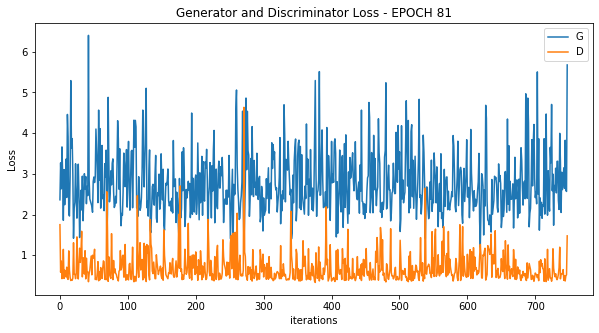

[83/100][374/748] Loss_D: 0.9036 Loss_G: 1.7404 D(x): 0.6063 D(G(z)): 0.2682 / 0.1711
[83/100][748/748] Loss_D: 0.3356 Loss_G: 9.0689 D(x): 0.9321 D(G(z)): 0.0001 / 0.0001



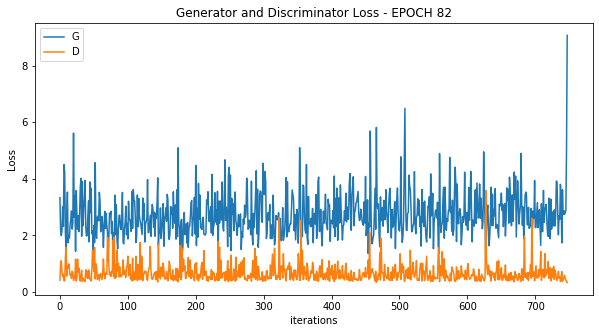

[84/100][374/748] Loss_D: 0.4011 Loss_G: 2.9650 D(x): 0.8843 D(G(z)): 0.0470 / 0.0470
[84/100][748/748] Loss_D: 0.8296 Loss_G: 6.4126 D(x): 0.9997 D(G(z)): 0.0013 / 0.0015



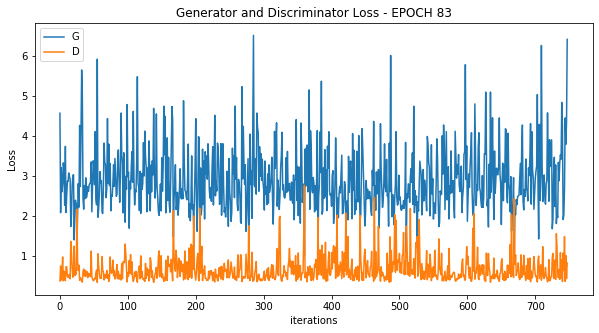

[85/100][374/748] Loss_D: 0.4673 Loss_G: 2.7160 D(x): 0.8635 D(G(z)): 0.1075 / 0.0545
[85/100][748/748] Loss_D: 2.5177 Loss_G: 4.5801 D(x): 0.0814 D(G(z)): 0.1487 / 0.0062



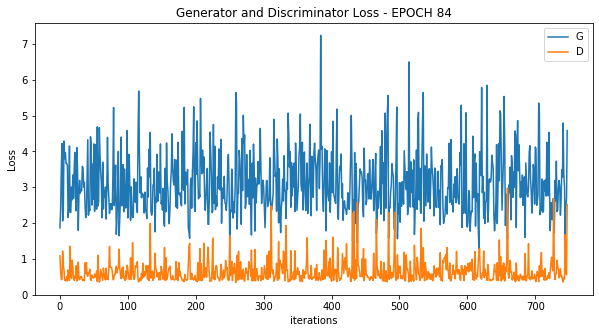

[86/100][374/748] Loss_D: 1.3764 Loss_G: 1.7473 D(x): 0.3110 D(G(z)): 0.1699 / 0.1651
[86/100][748/748] Loss_D: 7.5465 Loss_G: 1.5452 D(x): 0.0003 D(G(z)): 0.0589 / 0.1837



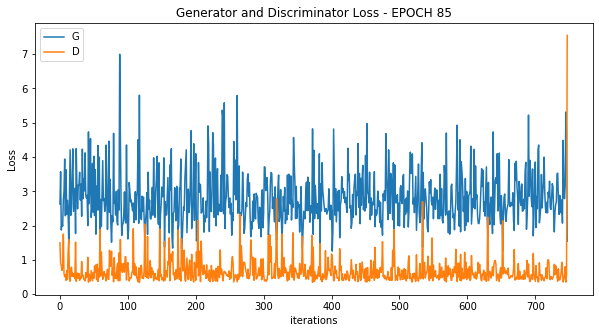

[87/100][374/748] Loss_D: 0.4618 Loss_G: 3.4934 D(x): 0.9757 D(G(z)): 0.0550 / 0.0253
[87/100][748/748] Loss_D: 0.6999 Loss_G: 5.9371 D(x): 0.6370 D(G(z)): 0.0017 / 0.0062



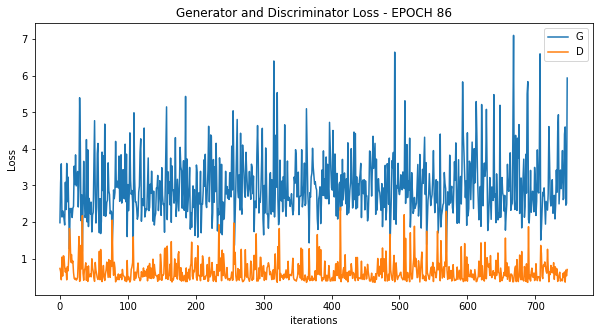

[88/100][374/748] Loss_D: 0.5276 Loss_G: 2.6365 D(x): 0.8221 D(G(z)): 0.1372 / 0.0589
[88/100][748/748] Loss_D: 0.7214 Loss_G: 8.4964 D(x): 0.9992 D(G(z)): 0.0001 / 0.0001



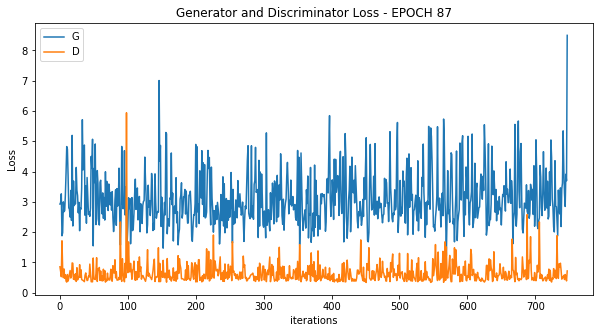

[89/100][374/748] Loss_D: 0.6741 Loss_G: 2.1488 D(x): 0.8805 D(G(z)): 0.2578 / 0.1129
[89/100][748/748] Loss_D: 1.7701 Loss_G: 3.1089 D(x): 0.1533 D(G(z)): 0.0404 / 0.0420



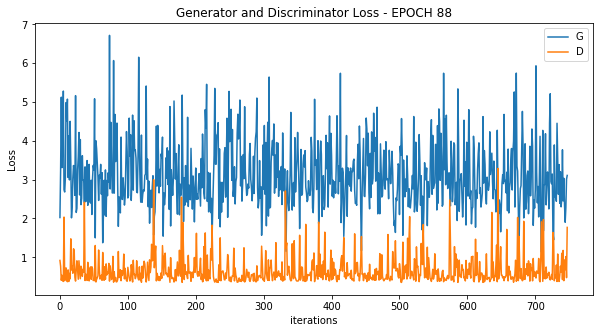

[90/100][374/748] Loss_D: 0.6412 Loss_G: 2.7152 D(x): 0.9610 D(G(z)): 0.1991 / 0.0535
[90/100][748/748] Loss_D: 0.4708 Loss_G: 5.1330 D(x): 0.8846 D(G(z)): 0.0031 / 0.0045



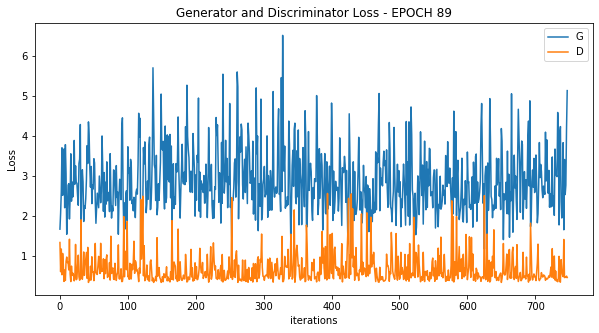

[91/100][374/748] Loss_D: 0.6925 Loss_G: 2.4872 D(x): 0.8816 D(G(z)): 0.2694 / 0.0700
[91/100][748/748] Loss_D: 0.6575 Loss_G: 11.3775 D(x): 0.5230 D(G(z)): 0.0000 / 0.0000



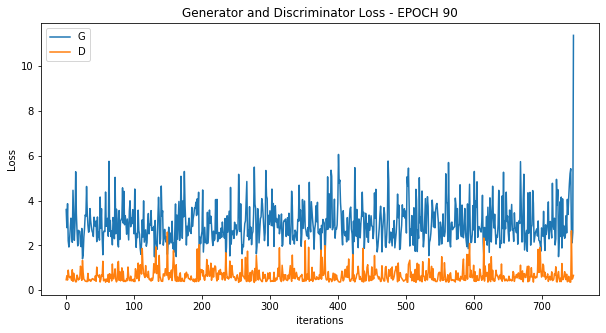

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


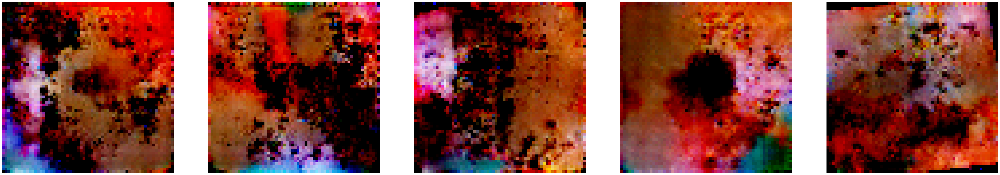

[92/100][374/748] Loss_D: 0.4637 Loss_G: 2.9073 D(x): 0.7715 D(G(z)): 0.0572 / 0.0564
[92/100][748/748] Loss_D: 0.4982 Loss_G: 7.9632 D(x): 0.9890 D(G(z)): 0.0002 / 0.0001



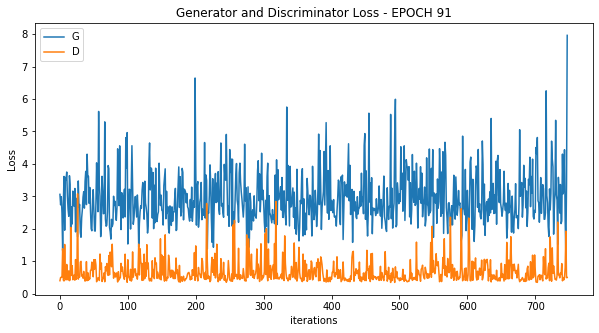

[93/100][374/748] Loss_D: 0.5452 Loss_G: 2.2301 D(x): 0.7893 D(G(z)): 0.1389 / 0.0975
[93/100][748/748] Loss_D: 0.4058 Loss_G: 5.1792 D(x): 0.9687 D(G(z)): 0.0293 / 0.0032



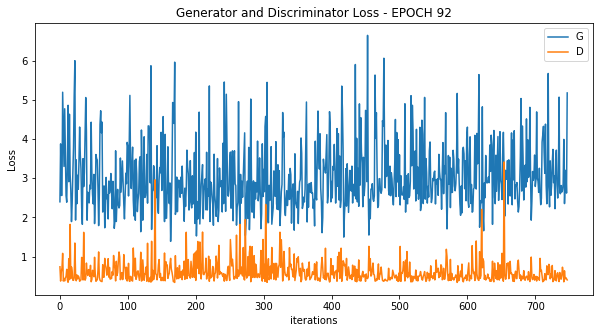

[94/100][374/748] Loss_D: 0.5408 Loss_G: 2.5141 D(x): 0.9708 D(G(z)): 0.1173 / 0.0770
[94/100][748/748] Loss_D: 0.9029 Loss_G: 4.2946 D(x): 0.4658 D(G(z)): 0.0065 / 0.0094



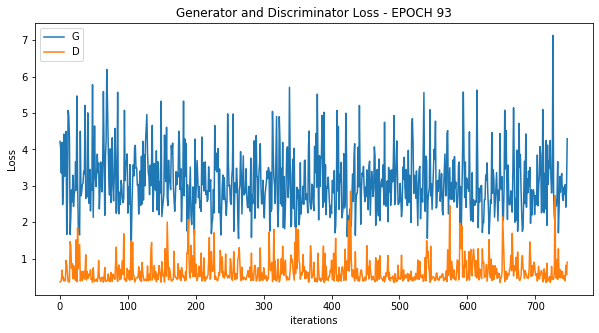

[95/100][374/748] Loss_D: 0.3863 Loss_G: 4.5560 D(x): 0.8123 D(G(z)): 0.0097 / 0.0091
[95/100][748/748] Loss_D: 2.6889 Loss_G: 2.5523 D(x): 0.0627 D(G(z)): 0.0154 / 0.0725



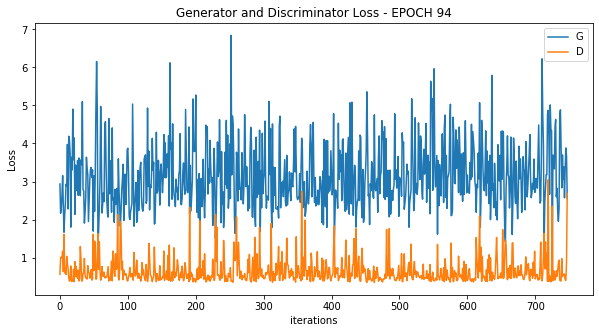

[96/100][374/748] Loss_D: 0.4858 Loss_G: 3.4352 D(x): 0.7045 D(G(z)): 0.0257 / 0.0262
[96/100][748/748] Loss_D: 2.0281 Loss_G: 4.2269 D(x): 0.1326 D(G(z)): 0.0067 / 0.0104



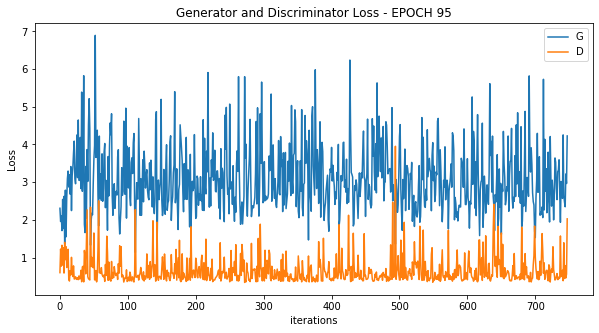

[97/100][374/748] Loss_D: 0.7379 Loss_G: 2.8332 D(x): 0.5876 D(G(z)): 0.0978 / 0.0493
[97/100][748/748] Loss_D: 0.4016 Loss_G: 11.1422 D(x): 0.7534 D(G(z)): 0.0000 / 0.0000



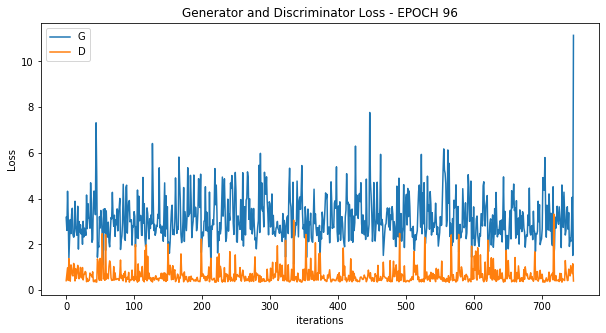

[98/100][374/748] Loss_D: 0.9702 Loss_G: 4.8987 D(x): 0.3923 D(G(z)): 0.0017 / 0.0065
[98/100][748/748] Loss_D: 1.2724 Loss_G: 3.3422 D(x): 0.2723 D(G(z)): 0.0151 / 0.0338



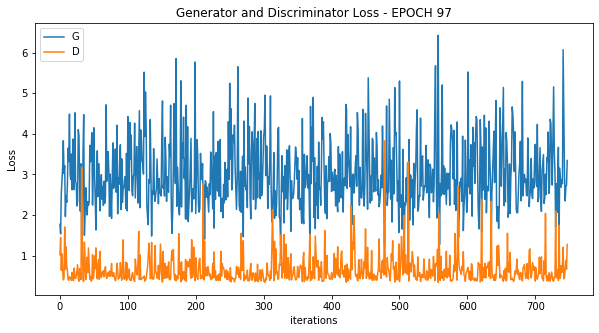

[99/100][374/748] Loss_D: 0.4866 Loss_G: 2.4645 D(x): 0.9099 D(G(z)): 0.1264 / 0.0733
[99/100][748/748] Loss_D: 0.5446 Loss_G: 8.0491 D(x): 0.9951 D(G(z)): 0.0001 / 0.0001



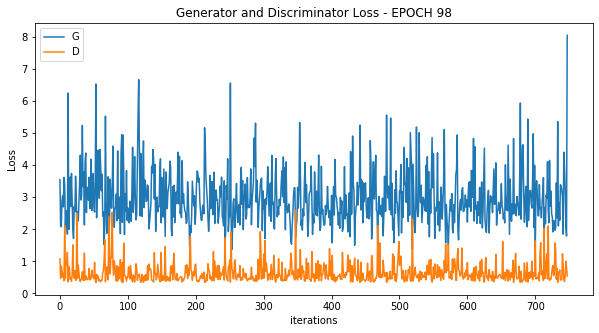

[100/100][374/748] Loss_D: 0.6309 Loss_G: 2.2933 D(x): 0.9034 D(G(z)): 0.2256 / 0.0889
[100/100][748/748] Loss_D: 1.3855 Loss_G: 12.1731 D(x): 0.8957 D(G(z)): 0.4843 / 0.0271



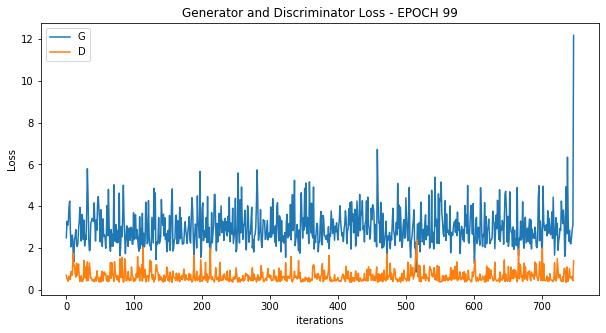

In [17]:
for epoch in range(epochs):
    
    start = time.time()
    for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        # train with real
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        # train with fake
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        labels.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
    plot_loss (G_losses, D_losses, epoch)
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)
    
#             valid_image = netG(fixed_noise)

In [18]:
print (">> average EPOCH duration = ", np.mean(epoch_time))

>> average EPOCH duration =  2449.3491138863565


# Generation example

**WARNING,THIS CONTAINS IMAGES THAT MAY HURT THE SENSITIVITY OF SOME PEOPLE**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


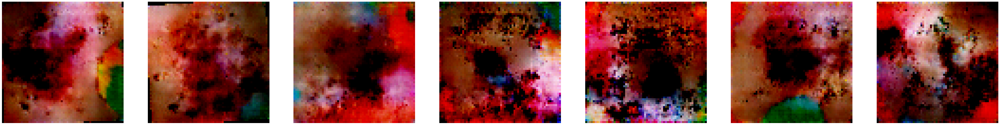

In [19]:
show_generated_img(7)

In [20]:
if not os.path.exists('../output_images'):
    os.mkdir('../output_images')
    
im_batch_size = 50
n_images=10000

for i_batch in tqdm(range(0, n_images, im_batch_size)):
    gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)
    gen_images = netG(gen_z)
    images = gen_images.to("cpu").clone().detach()
    images = images.numpy().transpose(0, 2, 3, 1)
    for i_image in range(gen_images.size(0)):
        save_image(gen_images[i_image, :, :, :], os.path.join('../output_images', f'image_{i_batch+i_image:05d}.png'))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

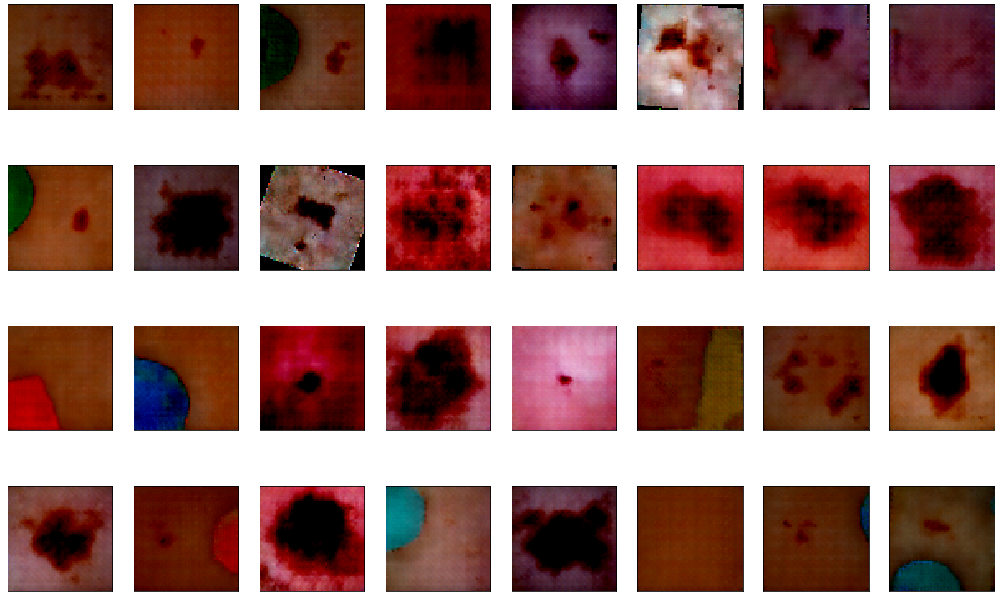

In [21]:
fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for i, j in enumerate(images[:32]):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    plt.imshow(j)

### Submission

In [22]:
import shutil
shutil.make_archive('images', 'zip', '../output_images')

'C:\\Users\\my\\Desktop\\GAN\\venv\\images.zip'

### Save models

In [23]:
torch.save(netG.state_dict(), 'generator.pth')
torch.save(netD.state_dict(), 'discriminator.pth')

# MiFID metric

Base code from [Demo MiFID metric for Dog image generation comp](https://www.kaggle.com/wendykan/demo-mifid-metric-for-dog-image-generation-comp)

In [24]:
from __future__ import absolute_import, division, print_function
import numpy as np
import os
import gzip, pickle
import tensorflow as tf
from scipy import linalg
import pathlib
import urllib
import warnings
from PIL import Image

class KernelEvalException(Exception):
    pass

model_params = {
    'Inception': {
        'name': 'Inception', 
        'imsize': 64,
        'output_layer': 'Pretrained_Net/pool_3:0', 
        'input_layer': 'Pretrained_Net/ExpandDims:0',
        'output_shape': 2048,
        'cosine_distance_eps': 0.1
        }
}

def create_model_graph(pth):
    """Creates a graph from saved GraphDef file."""
    # Creates graph from saved graph_def.pb.
    with tf.gfile.FastGFile( pth, 'rb') as f:
        graph_def = tf.GraphDef()
        graph_def.ParseFromString( f.read())
        _ = tf.import_graph_def( graph_def, name='Pretrained_Net')

def _get_model_layer(sess, model_name):
    # layername = 'Pretrained_Net/final_layer/Mean:0'
    layername = model_params[model_name]['output_layer']
    layer = sess.graph.get_tensor_by_name(layername)
    ops = layer.graph.get_operations()
    for op_idx, op in enumerate(ops):
        for o in op.outputs:
            shape = o.get_shape()
            if shape._dims != []:
              shape = [s.value for s in shape]
              new_shape = []
              for j, s in enumerate(shape):
                if s == 1 and j == 0:
                  new_shape.append(None)
                else:
                  new_shape.append(s)
              o.__dict__['_shape_val'] = tf.TensorShape(new_shape)
    return layer

def get_activations(images, sess, model_name, batch_size=50, verbose=False):
    """Calculates the activations of the pool_3 layer for all images.

    Params:
    -- images      : Numpy array of dimension (n_images, hi, wi, 3). The values
                     must lie between 0 and 256.
    -- sess        : current session
    -- batch_size  : the images numpy array is split into batches with batch size
                     batch_size. A reasonable batch size depends on the disposable hardware.
    -- verbose    : If set to True and parameter out_step is given, the number of calculated
                     batches is reported.
    Returns:
    -- A numpy array of dimension (num images, 2048) that contains the
       activations of the given tensor when feeding inception with the query tensor.
    """
    inception_layer = _get_model_layer(sess, model_name)
    n_images = images.shape[0]
    if batch_size > n_images:
        print("warning: batch size is bigger than the data size. setting batch size to data size")
        batch_size = n_images
    n_batches = n_images//batch_size + 1
    pred_arr = np.empty((n_images,model_params[model_name]['output_shape']))
    for i in tqdm(range(n_batches)):
        if verbose:
            print("\rPropagating batch %d/%d" % (i+1, n_batches), end="", flush=True)
        start = i*batch_size
        if start+batch_size < n_images:
            end = start+batch_size
        else:
            end = n_images
                    
        batch = images[start:end]
        pred = sess.run(inception_layer, {model_params[model_name]['input_layer']: batch})
        pred_arr[start:end] = pred.reshape(-1,model_params[model_name]['output_shape'])
    if verbose:
        print(" done")
    return pred_arr


# def calculate_memorization_distance(features1, features2):
#     neigh = NearestNeighbors(n_neighbors=1, algorithm='kd_tree', metric='euclidean')
#     neigh.fit(features2) 
#     d, _ = neigh.kneighbors(features1, return_distance=True)
#     print('d.shape=',d.shape)
#     return np.mean(d)

def normalize_rows(x: np.ndarray):
    """
    function that normalizes each row of the matrix x to have unit length.

    Args:
     ``x``: A numpy matrix of shape (n, m)

    Returns:
     ``x``: The normalized (by row) numpy matrix.
    """
    return np.nan_to_num(x/np.linalg.norm(x, ord=2, axis=1, keepdims=True))


def cosine_distance(features1, features2):
    # print('rows of zeros in features1 = ',sum(np.sum(features1, axis=1) == 0))
    # print('rows of zeros in features2 = ',sum(np.sum(features2, axis=1) == 0))
    features1_nozero = features1[np.sum(features1, axis=1) != 0]
    features2_nozero = features2[np.sum(features2, axis=1) != 0]
    norm_f1 = normalize_rows(features1_nozero)
    norm_f2 = normalize_rows(features2_nozero)

    d = 1.0-np.abs(np.matmul(norm_f1, norm_f2.T))
    print('d.shape=',d.shape)
    print('np.min(d, axis=1).shape=',np.min(d, axis=1).shape)
    mean_min_d = np.mean(np.min(d, axis=1))
    print('distance=',mean_min_d)
    return mean_min_d


def distance_thresholding(d, eps):
    if d < eps:
        return d
    else:
        return 1

def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    """Numpy implementation of the Frechet Distance.
    The Frechet distance between two multivariate Gaussians X_1 ~ N(mu_1, C_1)
    and X_2 ~ N(mu_2, C_2) is
            d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2)).
            
    Stable version by Dougal J. Sutherland.

    Params:
    -- mu1 : Numpy array containing the activations of the pool_3 layer of the
             inception net ( like returned by the function 'get_predictions')
             for generated samples.
    -- mu2   : The sample mean over activations of the pool_3 layer, precalcualted
               on an representive data set.
    -- sigma1: The covariance matrix over activations of the pool_3 layer for
               generated samples.
    -- sigma2: The covariance matrix over activations of the pool_3 layer,
               precalcualted on an representive data set.

    Returns:
    --   : The Frechet Distance.
    """

    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)

    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    assert mu1.shape == mu2.shape, "Training and test mean vectors have different lengths"
    assert sigma1.shape == sigma2.shape, "Training and test covariances have different dimensions"

    diff = mu1 - mu2

    # product might be almost singular
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        msg = "fid calculation produces singular product; adding %s to diagonal of cov estimates" % eps
        warnings.warn(msg)
        offset = np.eye(sigma1.shape[0]) * eps
        # covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))
    
    # numerical error might give slight imaginary component
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            raise ValueError("Imaginary component {}".format(m))
        covmean = covmean.real

    # covmean = tf.linalg.sqrtm(tf.linalg.matmul(sigma1,sigma2))

    print('covmean.shape=',covmean.shape)
    # tr_covmean = tf.linalg.trace(covmean)

    tr_covmean = np.trace(covmean)
    return diff.dot(diff) + np.trace(sigma1) + np.trace(sigma2) - 2 * tr_covmean
    # return diff.dot(diff) + tf.linalg.trace(sigma1) + tf.linalg.trace(sigma2) - 2 * tr_covmean
#-------------------------------------------------------------------------------


def calculate_activation_statistics(images, sess, model_name, batch_size=50, verbose=False):
    """Calculation of the statistics used by the FID.
    Params:
    -- images      : Numpy array of dimension (n_images, hi, wi, 3). The values
                     must lie between 0 and 255.
    -- sess        : current session
    -- batch_size  : the images numpy array is split into batches with batch size
                     batch_size. A reasonable batch size depends on the available hardware.
    -- verbose     : If set to True and parameter out_step is given, the number of calculated
                     batches is reported.
    Returns:
    -- mu    : The mean over samples of the activations of the pool_3 layer of
               the incption model.
    -- sigma : The covariance matrix of the activations of the pool_3 layer of
               the incption model.
    """
    act = get_activations(images, sess, model_name, batch_size, verbose)
    mu = np.mean(act, axis=0)
    sigma = np.cov(act, rowvar=False)
    return mu, sigma, act
    
def _handle_path_memorization(path, sess, model_name, is_checksize, is_check_png):
    path = pathlib.Path(path)
    files = list(path.glob('*.jpg')) + list(path.glob('*.png'))
    imsize = model_params[model_name]['imsize']

    # In production we don't resize input images. This is just for demo purpose. 
    x = np.array([np.array(img_read_checks(fn, imsize, is_checksize, imsize, is_check_png)) for fn in files])
    m, s, features = calculate_activation_statistics(x, sess, model_name)
    del x #clean up memory
    return m, s, features

# check for image size
def img_read_checks(filename, resize_to, is_checksize=False, check_imsize = 64, is_check_png = False):
    im = Image.open(str(filename))
    if is_checksize and im.size != (check_imsize,check_imsize):
        raise KernelEvalException('The images are not of size '+str(check_imsize))
    
    if is_check_png and im.format != 'PNG':
        raise KernelEvalException('Only PNG images should be submitted.')

    if resize_to is None:
        return im
    else:
        return im.resize((resize_to,resize_to),Image.ANTIALIAS)

def calculate_kid_given_paths(paths, model_name, model_path, feature_path=None):
    ''' Calculates the KID of two paths. '''
    tf.reset_default_graph()
    create_model_graph(str(model_path))
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        m1, s1, features1 = _handle_path_memorization(paths[0], sess, model_name, is_checksize = True, is_check_png = True)
        if feature_path is None:
            m2, s2, features2 = _handle_path_memorization(paths[1], sess, model_name, is_checksize = False, is_check_png = False)
        else:
            with np.load(feature_path) as f:
                m2, s2, features2 = f['m'], f['s'], f['features']

        print('m1,m2 shape=',(m1.shape,m2.shape),'s1,s2=',(s1.shape,s2.shape))
        print('starting calculating FID')
        fid_value = calculate_frechet_distance(m1, s1, m2, s2)
        print('done with FID, starting distance calculation')
        distance = cosine_distance(features1, features2)        
        return fid_value, distance

ModuleNotFoundError: No module named 'tensorflow'

In [ ]:
!ls ../output_images

**I have to fix this :(**

In [ ]:
user_images_unzipped_path = '../output_images'
images_path = [user_images_unzipped_path,'../all-dogs/all-dogs/']

model_path = '../input/dog-face-generation-competition-kid-metric-input/classify_image_graph_def.pb'

fid_epsilon = 10e-15

fid_value_public, distance_public = calculate_kid_given_paths(images_path, 'Inception', model_path)
distance_public = distance_thresholding(distance_public, model_params['Inception']['cosine_distance_eps'])
print("FID_public: ", fid_value_public, "distance_public: ", distance_public, "multiplied_public: ", fid_value_public /(distance_public + fid_epsilon))

# References

- [DCGAN baseline](https://www.kaggle.com/artgor/dcgan-baseline) by Andrew
- [RaLSGAN dogs](https://www.kaggle.com/speedwagon/ralsgan-dogs) by Vlad
- [GAN dogs starter](https://www.kaggle.com/wendykan/gan-dogs-starter)
- [GitHub Achronus generative_adversarial_networks](https://github.com/Achronus/Machine-Learning-101/blob/master/coding_templates_and_data_files/computer_vision/2.%20generative_adversarial_networks.py)
- [It’s Training Cats and Dogs: NVIDIA Research Uses AI to Turn Cats Into Dogs, Lions and Tigers, Too](https://blogs.nvidia.com/blog/2018/04/15/nvidia-research-image-translation/)
- [A Beginner's Guide to Generative Adversarial Networks (GANs)](https://skymind.ai/wiki/generative-adversarial-network-gan)

<br>
<br>

----

## I think I'll keep updating this, I like this comp and GANs :D
### btw, If you want to create a x5 team, I'm in :p

![](https://i.imgflip.com/34fezh.jpg)

